# Load

In [ ]:
%load_ext autoreload
%autoreload 2
%pylab inline
%matplotlib inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
from anndata import AnnData
from scipy.sparse import diags
from scipy.io import mmwrite
from scipy import sparse
from scipy.optimize import fsolve,minimize
from tqdm import tqdm
from pathlib import Path
from typing import Union, Optional
import pickle
import seaborn as sns

In [ ]:
from scipy.sparse import csr_matrix

In [ ]:
from scDenorm.denorm import *

In [ ]:
from scAnnot.tools import *

In [ ]:
import matplotlib as mpl
sc.set_figure_params(scanpy=True, fontsize=14,facecolor=None,frameon=False,transparent=True)
mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.grid'] = False

In [ ]:
def solve_bc(p,y1,y2):
    return sum((np.exp(y2*np.log(p[0]))-2*np.exp(y1*np.log(p[0]))+p[1])**2)

In [ ]:
from scipy.optimize import curve_fit

def fit_nb(ms):
    
    def nb_func(x, phi):
        return x[0] + (phi * x[0] ** 2)
    
    popt, _ = curve_fit(nb_func, ms['mean'], ms['var'], p0=[1])
    phi = popt[0]
    
    ms['zeros_p'] = np.exp(-ms['mean'])
    ms['zeros_nb'] = (1 + phi * ms['mean']) ** (-1 / phi)
    ms['newVar'] = ms['mean'] + phi * ms['mean'] ** 2
    return ms

In [ ]:
def plot_mv(cmean,cvar,ax,title,c='blue',fit=False,save=None):
    ax.loglog()
    ax.scatter(cmean, cvar,s=20,c=c)
    lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
        np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
    ]

    ax.plot(lims, lims, linestyle='--', linewidth=2, alpha=0.75, zorder=0,color='black', label='line')
    ax.set_aspect('equal')
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.spines[['right', 'top']].set_visible(False)
    ax.set_xlabel('Mean')
    ax.set_ylabel('Variance')
    ax.set_title(title)
    
    if fit:
        ms=pd.DataFrame({'mean':cmean[0],'var':cvar[0]})
        ms=fit_nb(ms)
        ms=ms.sort_values('mean')
        ax.plot(ms['mean'],ms['newVar'],'k-', alpha=1, zorder=ms.shape[0],color='red', label='line')
    if save:
        plt.savefig(save,dpi=300, bbox_inches='tight',transparent=True)

In [ ]:
def read_cellbrowser(folder):
    ad = sc.read_text(f'{folder}/exprMatrix.tsv.gz').T
    meta = pd.read_csv(f'{folder}/meta.tsv', sep="\t",index_col=0)
    ad.obs = meta
    ad.X=csr_matrix(ad.X)
    print(folder,ad.X.data)
    return ad

# Read UCB datasets

In [ ]:
fetal=read_cellbrowser('data/cellbrowserdatasets/fetal-lung/')

data/cellbrowserdatasets/fetal-lung/ [1.020855  1.020855  1.020855  ... 0.6704464 0.6704464 0.6704464]


In [ ]:
fetal

AnnData object with n_obs × n_vars = 36807 × 23832
    obs: 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'Sample', 'Age', 'Tissue', 'S.Score', 'G2M.Score', 'Phase', 'nCount_RNA', 'nFeature_RNA', 'Cell_group', 'Cell_type'

In [ ]:
fetal.obs.Cell_type.value_counts()

Mesenchyme RSPO2+                     13320
Mesenchyme SERPINF1-high               3927
Airway Smooth Muscle                   2824
Hematopoietic, T Cells                 1770
Endothelial                            1751
Multiciliated cell                     1353
Bud tip progenitor                     1296
Pericyte                               1240
Bud tip adjacent                       1228
Secretory progenitor                   1148
Cartilage                              1142
Basal cell                             1038
Club-like secretory                     886
Hematopoietic, B Cells                  649
Submucosal gland                        580
RBC                                     574
Hematopoietic, Macrophage               516
Epithelial                              356
Multiciliated precursor                 307
Neuroendocrine                          227
Hematopoietic, Natural Killer Cell      195
Goblet-like secretory                   179
Intermediate ciliated           

In [ ]:
fetal.obs

,nGene,nUMI,orig.ident,percent.mito,Sample,Age,Tissue,S.Score,G2M.Score,Phase,nCount_RNA,nFeature_RNA,Cell_group,Cell_type
index,,,,,,,,,,,,,,
S1_AAACCTGAGACACTAA,1953.0,5633.0,S1,0.012784,W11.5_distal,11.5,Distal,-0.046908,-0.077983,G1,5632.0,1952,Mesenchymal,Mesenchyme RSPO2+
S1_AAACCTGAGCGAGAAA,2240.0,6452.0,S1,0.028213,W11.5_distal,11.5,Distal,-0.056338,-0.140219,G1,6451.0,2239,Epithelial,Bud tip adjacent
S1_AAACCTGAGCTGTCTA,1632.0,4535.0,S1,0.013451,W11.5_distal,11.5,Distal,-0.091739,-0.049582,G1,4535.0,1632,Mesenchymal,Mesenchyme RSPO2+
S1_AAACCTGAGGTTACCT,1543.0,4230.0,S1,0.016556,W11.5_distal,11.5,Distal,-0.129946,-0.078479,G1,4228.0,1541,Mesenchymal,Mesenchyme RSPO2+
S1_AAACCTGAGTGTGGCA,3635.0,14342.0,S1,0.019805,W11.5_distal,11.5,Distal,0.232330,0.458178,G2M,14340.0,3633,Mesenchymal,Mesenchyme RSPO2+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
S8_TTTGTCAAGTGACTCT,3807.0,12477.0,S8,0.043524,W21_trachea,21.0,Trachea,-0.204046,-0.103055,G1,12476.0,3806,Epithelial,Multiciliated cell
S8_TTTGTCACAGGGTACA,2860.0,12212.0,S8,0.019573,W21_trachea,21.0,Trachea,-0.069373,-0.078622,G1,12211.0,2859,Immune,"Hematopoietic, Macrophage"
S8_TTTGTCAGTGCAACTT,5322.0,48893.0,S8,0.030353,W21_trachea,21.0,Trachea,0.367777,0.511558,G2M,48891.0,5320,RBC,RBC


In [ ]:
miller=sc.read('/home/xu_lahong/LungAtlas/V1/2_Fetal_airway_Miller_2022.h5')
he=sc.read('/home/xu_lahong/LungAtlas/V1/3_Fetal_Lung_He_2022.h5')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [ ]:
miller

AnnData object with n_obs × n_vars = 36807 × 23832
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'Sample', 'Age', 'Tissue', 'Sex', 'all_cell_combined_cluster_index', 'lineage', 'epithelial_cell_type', 'cell_ID', 'seq_tech', 'donor_gender', 'donor_age', 'original_name', 'ethnicity', 'organ', 'species', 'seq_method', 'sample_ID', 'project_code', 'reference', 'donor_status', 'sample_status', 'treatment', 'if_patient', 'sample_type', 'region', 'donor_ID', 'sample', 'batch', 'n_genes', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'study_new', 'AgeGroup', 'doublet_score', 'predicted_doublet'

In [ ]:
miller.obs.ann_level_1.value_counts()

Mesenchymal    22453
Epithelial      8799
Immune          3230
Endothelial     1751
RBC              574
Name: ann_level_1, dtype: int64

In [ ]:
miller.obs.lineage.value_counts()

Mesenchymal    22453
Epithelial      8799
Immune          3230
Endothelial     1751
RBC              574
Name: lineage, dtype: int64

In [ ]:
miller.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,Sample,Age,Tissue,Sex,all_cell_combined_cluster_index,lineage,...,n_genes,ann_level_1,ann_level_2,ann_level_3,ann_level_4,ann_level_5,study_new,AgeGroup,doublet_score,predicted_doublet
S1_AAACCTGAGACACTAA,S1,5633,1953,0.012784,W11.5_distal,11.5,Distal,Male,11,Mesenchymal,...,1952,Mesenchymal,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW11.5,0.063380,False
S1_AAACCTGAGCGAGAAA,S1,6452,2240,0.028213,W11.5_distal,11.5,Distal,Male,4,Epithelial,...,2239,Epithelial,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW11.5,0.058902,False
S1_AAACCTGAGCTGTCTA,S1,4535,1632,0.013451,W11.5_distal,11.5,Distal,Male,11,Mesenchymal,...,1632,Mesenchymal,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW11.5,0.026868,False
S1_AAACCTGAGGTTACCT,S1,4230,1543,0.016556,W11.5_distal,11.5,Distal,Male,11,Mesenchymal,...,1541,Mesenchymal,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW11.5,0.034516,False
S1_AAACCTGAGTGTGGCA,S1,14342,3635,0.019805,W11.5_distal,11.5,Distal,Male,12,Mesenchymal,...,3633,Mesenchymal,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW11.5,0.128019,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
S8_TTTGTCAAGTGACTCT,S8,12477,3807,0.043524,W21_trachea,21.0,Trachea,Female,3,Epithelial,...,3806,Epithelial,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW21.0,0.010175,False
S8_TTTGTCACAGGGTACA,S8,12212,2860,0.019573,W21_trachea,21.0,Trachea,Female,26,Immune,...,2859,Immune,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW21.0,0.025086,False
S8_TTTGTCAGTGCAACTT,S8,48893,5322,0.030353,W21_trachea,21.0,Trachea,Female,27,RBC,...,5320,RBC,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW21.0,0.044776,False
S8_TTTGTCATCACTATTC,S8,10099,2974,0.033970,W21_trachea,21.0,Trachea,Female,2,Epithelial,...,2972,Epithelial,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,epithelial_cell_type,Fetal_airway_Miller_2022,PCW21.0,0.020113,False


In [ ]:
he.obs.organ.value_counts()

Lung        26804
Proximal    22901
Distal      22047
Name: organ, dtype: int64

In [ ]:
he.obs.broad_celltype.value_counts()

Fibroblast             31413
Myofibro & SMC          7108
Other myeloid           6883
Distal epithelial       6582
Proximal epithelial     4155
B                       4138
Vas endothelial         2793
NK                      2623
T & ILC                 2155
Meg-ery                 1707
Lymph endothelial       1039
PNS                      649
Mesothelial              404
Chondrocyte              103
Name: broad_celltype, dtype: int64

In [ ]:
he.obs[['new_celltype', 'big_cluster','broad_celltype', 'original_name', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5']]

,new_celltype,big_cluster,broad_celltype,original_name,ann_level_1,ann_level_2,ann_level_3,ann_level_4,ann_level_5
AAACCTGAGACAGGCT-5891STDY8062349,Alveolar fibro,C0,Fibroblast,Alveolar fibro,Fibroblast,new_celltype,new_celltype,new_celltype,new_celltype
AAACCTGCACCGAATT-5891STDY8062349,Alveolar fibro,C0,Fibroblast,Alveolar fibro,Fibroblast,new_celltype,new_celltype,new_celltype,new_celltype
AAAGATGTCGTGACAT-5891STDY8062349,Alveolar fibro,C0,Fibroblast,Alveolar fibro,Fibroblast,new_celltype,new_celltype,new_celltype,new_celltype
AAAGCAACAAACGTGG-5891STDY8062349,Alveolar fibro,C0,Fibroblast,Alveolar fibro,Fibroblast,new_celltype,new_celltype,new_celltype,new_celltype
AAAGCAACATACTACG-5891STDY8062349,Alveolar fibro,C0,Fibroblast,Alveolar fibro,Fibroblast,new_celltype,new_celltype,new_celltype,new_celltype
...,...,...,...,...,...,...,...,...,...
GTCACGGAGCCCTAAT-WSSS_F_LNG8713184,Mast,C8,Other myeloid,Mast,Other myeloid,new_celltype,new_celltype,new_celltype,new_celltype
ACGGGCTGTTCAGCGC-WSSS_F_LNG8713185,Mast,C8,Other myeloid,Mast,Other myeloid,new_celltype,new_celltype,new_celltype,new_celltype
CATCGAACATTAACCG-WSSS_F_LNG8713185,Mast,C8,Other myeloid,Mast,Other myeloid,new_celltype,new_celltype,new_celltype,new_celltype
CTCAGAAGTACTCTCC-WSSS_F_LNG8713185,Mast,C8,Other myeloid,Mast,Other myeloid,new_celltype,new_celltype,new_celltype,new_celltype


In [ ]:
he.obs

,batch,stage,dissection,chemistry,percent_mito,n_counts,n_genes,doublet_scores,bh_pval,leiden,...,if_patient,sample_ID,sample_status,sample_type,region,organ,study_new,AgeGroup,doublet_score,predicted_doublet
AAACCTGAGACAGGCT-5891STDY8062349,5891STDY8062349,18.0,Proximal,Normal,0.042116,8711.0,3101,0.060127,0.826769,0,...,False,5891STDY8062349,Healthy,Fetal,Unclassified,Proximal,Fetal_lung_He_2022,PCW18.0,0.032321,False
AAACCTGCACCGAATT-5891STDY8062349,5891STDY8062349,18.0,Proximal,Normal,0.042811,8228.0,2992,0.131980,0.826769,0,...,False,5891STDY8062349,Healthy,Fetal,Unclassified,Proximal,Fetal_lung_He_2022,PCW18.0,0.056552,False
AAAGATGTCGTGACAT-5891STDY8062349,5891STDY8062349,18.0,Proximal,Normal,0.052119,3601.0,1714,0.051245,0.826769,0,...,False,5891STDY8062349,Healthy,Fetal,Unclassified,Proximal,Fetal_lung_He_2022,PCW18.0,0.039560,False
AAAGCAACAAACGTGG-5891STDY8062349,5891STDY8062349,18.0,Proximal,Normal,0.069157,5707.0,2280,0.083019,0.826769,0,...,False,5891STDY8062349,Healthy,Fetal,Unclassified,Proximal,Fetal_lung_He_2022,PCW18.0,0.034553,False
AAAGCAACATACTACG-5891STDY8062349,5891STDY8062349,18.0,Proximal,Normal,0.065710,7095.0,2639,0.070568,0.826769,0,...,False,5891STDY8062349,Healthy,Fetal,Unclassified,Proximal,Fetal_lung_He_2022,PCW18.0,0.030246,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTCACGGAGCCCTAAT-WSSS_F_LNG8713184,WSSS_F_LNG8713184,15.0,Proximal,Normal,0.039884,9581.0,3133,0.330579,0.826283,8,...,False,WSSS_F_LNG8713184,Healthy,Fetal,Unclassified,Proximal,Fetal_lung_He_2022,PCW15.0,0.149888,False
ACGGGCTGTTCAGCGC-WSSS_F_LNG8713185,WSSS_F_LNG8713185,15.0,Distal,Normal,0.034237,2706.0,1305,0.394231,0.122739,8,...,False,WSSS_F_LNG8713185,Healthy,Fetal,Unclassified,Distal,Fetal_lung_He_2022,PCW15.0,0.266409,False
CATCGAACATTAACCG-WSSS_F_LNG8713185,WSSS_F_LNG8713185,15.0,Distal,Normal,0.040634,7625.0,2735,0.330579,0.122739,8,...,False,WSSS_F_LNG8713185,Healthy,Fetal,Unclassified,Distal,Fetal_lung_He_2022,PCW15.0,0.201201,False
CTCAGAAGTACTCTCC-WSSS_F_LNG8713185,WSSS_F_LNG8713185,15.0,Distal,Normal,0.027229,13147.0,3721,0.245161,0.122739,8,...,False,WSSS_F_LNG8713185,Healthy,Fetal,Unclassified,Distal,Fetal_lung_He_2022,PCW15.0,0.130977,False


In [ ]:
he.X.data

array([0.76452494, 0.76452494, 1.4915372 , ..., 0.39650372, 0.6796748 ,
       0.39650372], dtype=float32)

In [ ]:
he1=scdenorm(he)

100%|██████████| 71752/71752 [00:24<00:00, 2951.20it/s]


In [ ]:
pd.Series(he1.X.data).value_counts()

1.0       122460282
2.0        34536392
3.0        13776095
4.0         6940921
5.0         4076069
            ...    
9523.0            1
4928.0            1
5182.0            1
5181.0            1
2292.0            1
Length: 4721, dtype: int64

In [ ]:
fetal1=scdenorm(fetal)

100%|██████████| 36807/36807 [00:12<00:00, 2899.95it/s]


In [ ]:
fetal1.X.data

array([1., 1., 1., ..., 1., 1., 1.], dtype=float32)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


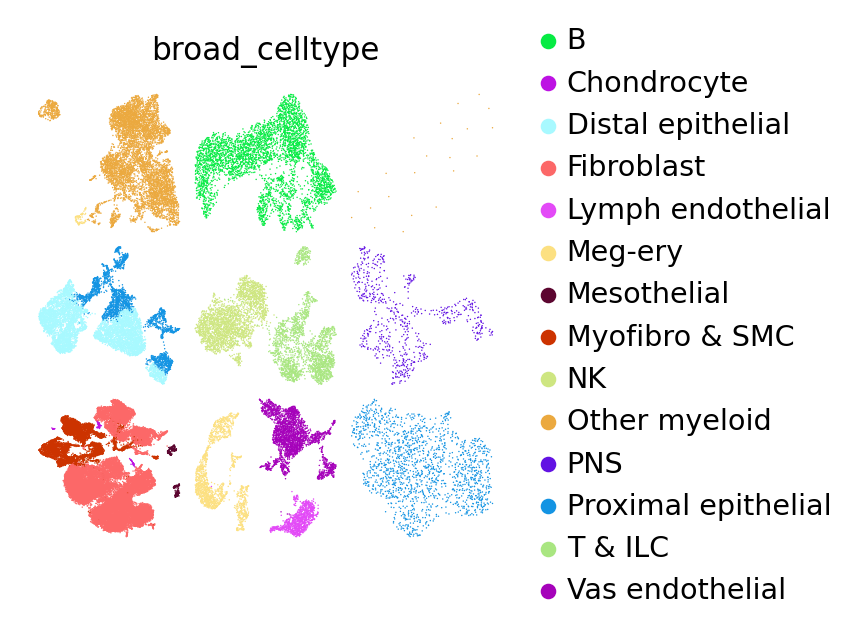

In [ ]:
sc.pl.umap(he,color=['broad_celltype'])

In [ ]:
he

AnnData object with n_obs × n_vars = 71752 × 26568
    obs: 'batch', 'stage', 'dissection', 'chemistry', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'leiden', 'phase', 'S_score', 'G2M_score', 'new_celltype', 'big_cluster', 'donor', 'gender', 'new_celltype-code', 'status_summary', 'productive_summary', 'isotype_summary', 'receptor_type', 'receptor_subtype', 'broad_celltype', 'cell_ID', 'seq_tech', 'seq_method', 'original_name', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'donor_ID', 'donor_gender', 'donor_age', 'ethnicity', 'treatment', 'if_patient', 'sample_ID', 'sample_status', 'sample_type', 'region', 'organ', 'study_new', 'AgeGroup', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'n_cells', 'highly_variable5891STDY8062349', 'highly_variable5891STDY8062350', 'highly_variable5891STDY8062351', 'highly_variable5891STDY8062352', 'highly_variable5891STDY8062353', 'highly_variable5891STDY8062354', 'highly_variable5891STDY806

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


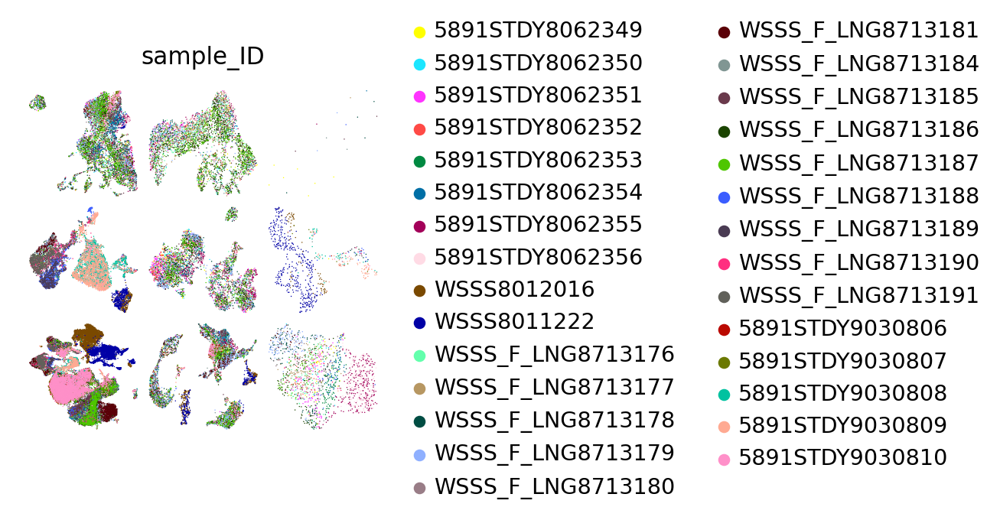

In [ ]:
sc.pl.umap(he,color=['sample_ID'])

In [ ]:
he1.obs['sample']=he1.obs['sample_ID']

In [ ]:
fetal1.obs['sample']=fetal1.obs['Sample']

In [ ]:
fetal.obs['sample']=fetal.obs['Sample']

In [ ]:
ad1=he1.concatenate(fetal1)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [ ]:
ad1

AnnData object with n_obs × n_vars = 108559 × 17349
    obs: 'batch', 'stage', 'dissection', 'chemistry', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'leiden', 'phase', 'S_score', 'G2M_score', 'new_celltype', 'big_cluster', 'donor', 'gender', 'new_celltype-code', 'status_summary', 'productive_summary', 'isotype_summary', 'receptor_type', 'receptor_subtype', 'broad_celltype', 'cell_ID', 'seq_tech', 'seq_method', 'original_name', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'donor_ID', 'donor_gender', 'donor_age', 'ethnicity', 'treatment', 'if_patient', 'sample_ID', 'sample_status', 'sample_type', 'region', 'organ', 'study_new', 'AgeGroup', 'doublet_score', 'predicted_doublet', 'sample', 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'Sample', 'Age', 'Tissue', 'S.Score', 'G2M.Score', 'Phase', 'nCount_RNA', 'nFeature_RNA', 'Cell_group', 'Cell_type'
    var: 'gene_ids-0', 'n_cells-0', 'highly_variable5891STDY8062349-0', 'highly_variable

In [ ]:
ad1.layers['counts']=ad1.X.copy()

In [ ]:
sc.pp.highly_variable_genes(
    ad1,
    flavor="seurat_v3",
    n_top_genes=2000,
    layer="counts",
    batch_key="sample",
    subset=False
)

In [ ]:
sc.pp.normalize_total(ad1, target_sum=1e4)
sc.pp.log1p(ad1)

In [ ]:
sc.tl.pca(ad1, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(ad1)
sc.tl.umap(ad1)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


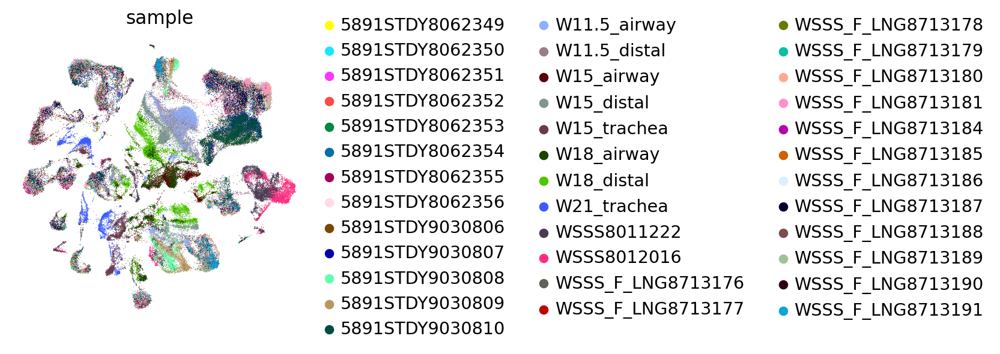

In [ ]:
sc.pl.umap(ad1, color=['sample'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


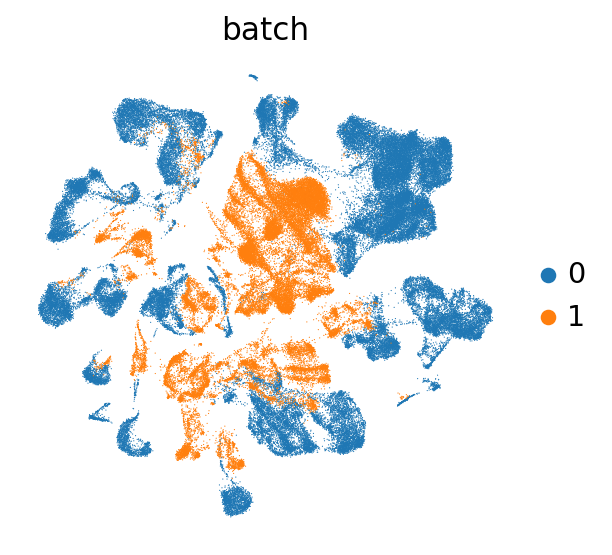

In [ ]:
sc.pl.umap(ad1, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


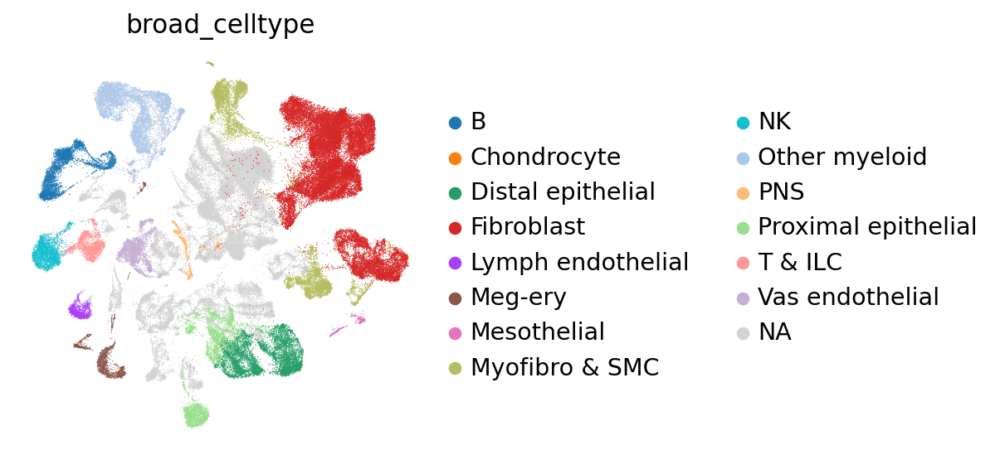

In [ ]:
sc.pl.umap(ad1, color=['broad_celltype'])

In [ ]:
ad1.obsm['X_umap_raw']=ad1.obsm['X_umap']

In [ ]:
sc.external.pp.harmony_integrate(ad1, key = ['batch'])

2023-11-10 16:00:59,141 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2023-11-10 16:02:04,690 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2023-11-10 16:03:07,004 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2023-11-10 16:04:08,020 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2023-11-10 16:05:11,902 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2023-11-10 16:06:13,019 - harmonypy - INFO - Iteration 6 of 10
INFO:harmonypy:Iteration 6 of 10
2023-11-10 16:07:13,882 - harmonypy - INFO - Iteration 7 of 10
INFO:harmonypy:Iteration 7 of 10
2023-11-10 16:08:15,099 - harmonypy - INFO - Converged after 7 iterations
INFO:harmonypy:Converged after 7 iterations


In [ ]:
sc.pp.neighbors(ad1, use_rep='X_pca_harmony')
sc.tl.umap(ad1)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


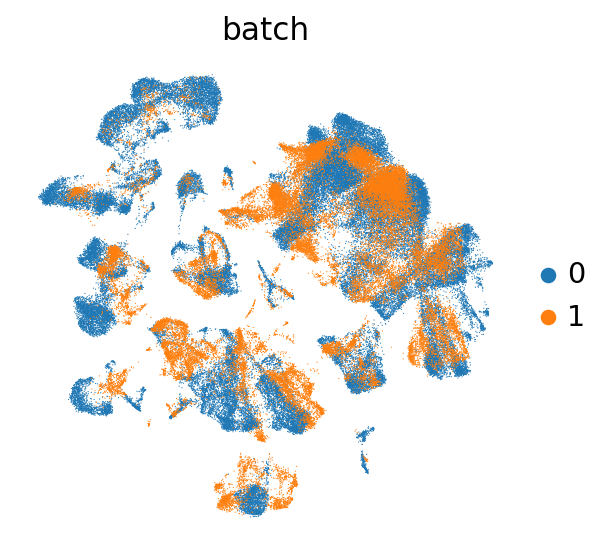

In [ ]:
sc.pl.umap(ad1, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


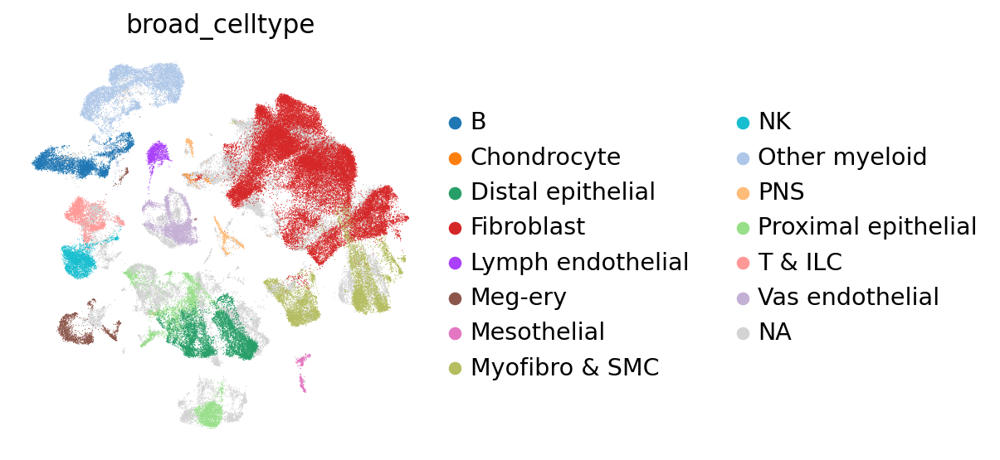

In [ ]:
sc.pl.umap(ad1, color=['broad_celltype'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


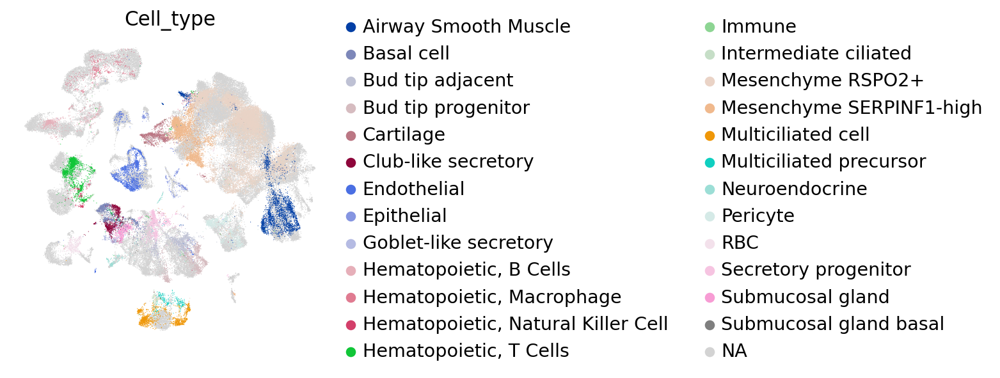

In [ ]:
sc.pl.umap(ad1, color=['Cell_type'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


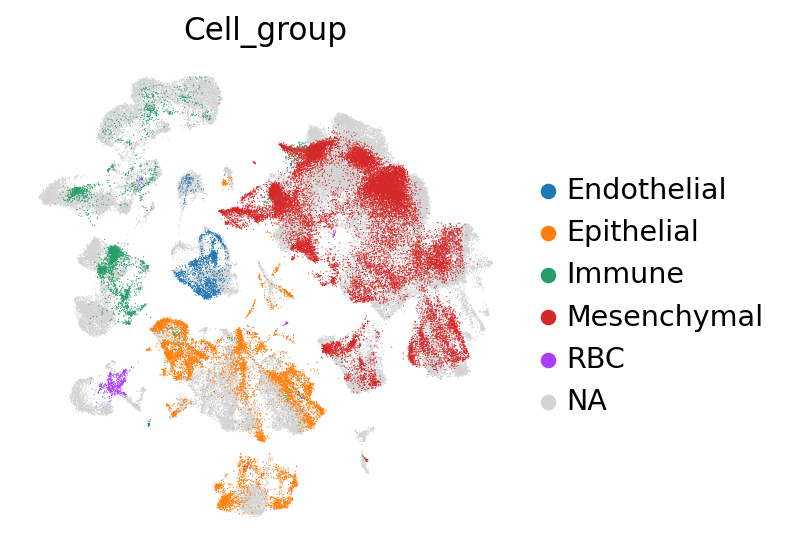

In [ ]:
sc.pl.umap(ad1, color=['Cell_group'])

In [ ]:
ad1.write_h5ad('data/integration/fetal_lung_raw_count.h5ad')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

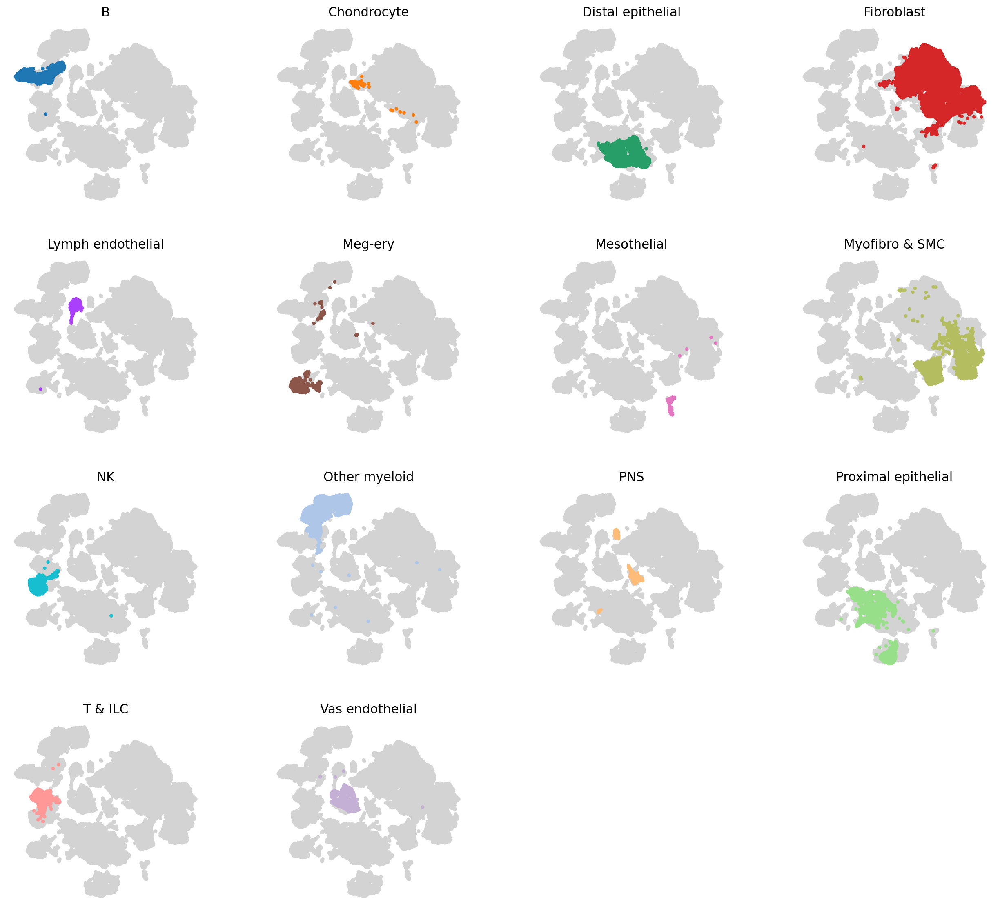

In [ ]:
cluster_small_multiples(ad1,'broad_celltype')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

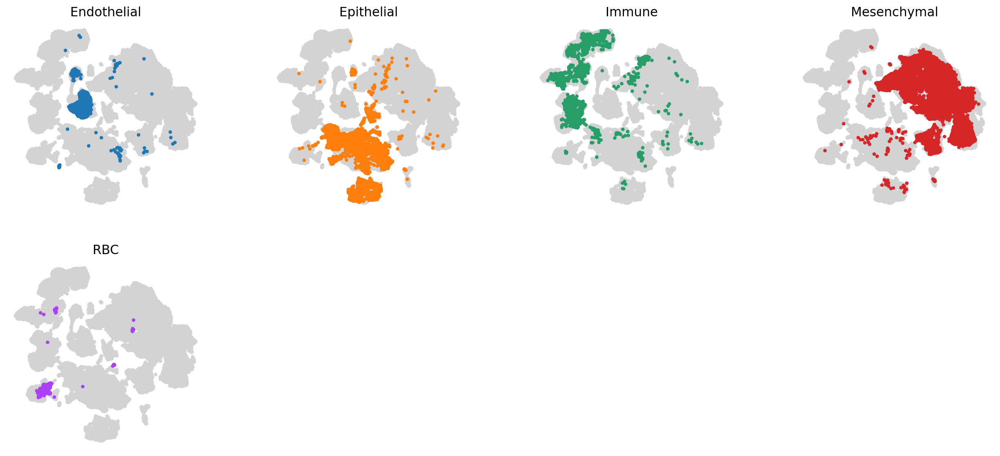

In [ ]:
cluster_small_multiples(ad1,'Cell_group')

In [ ]:
df=pd.Series(autism.var_names).str.split('|', expand=True)

In [ ]:
df.columns=['gene_ids','gene_names']
df.index=list(df.gene_names)

In [ ]:
autism.var=df

In [ ]:
autism.write_h5ad('data/integration/autism.h5ad')

... storing 'cluster' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'sex' as categorical
... storing 'diagnosis' as categorical
... storing 'Capbatch' as categorical
... storing 'Seqbatch' as categorical
... storing 'gene_names' as categorical


In [ ]:
autism=autism[:,~autism.var_names.duplicated()]

In [ ]:
autism

View of AnnData object with n_obs × n_vars = 104559 × 36254
    obs: 'cluster', 'sample', 'individual', 'region', 'age', 'sex', 'diagnosis', 'Capbatch', 'Seqbatch', 'post-mortem interval (hours)', 'RNA Integrity Number', 'genes', 'UMIs', 'RNA mitochondr. percent', 'RNA ribosomal percent'
    var: 'gene_ids', 'gene_names'

# As raw count

In [ ]:
ad2=ad.concatenate(autism)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [ ]:
ad2

AnnData object with n_obs × n_vars = 276679 × 23063
    obs: 'subtype', 'subclass', 'class', 'samplename', 'tech_rep', 'species', 'sample', 'donor_gender', 'donor_age', 'cell_ID', 'organ', 'project_code', 'reference', 'seq_tech', 'sample_type', 'seq_method', 'treatment', 'region', 'subregion', 'donor_ID', 'original_name', 'original_name2', 'donor_status', 'sample_status', 'if_patient', 'ethnicity', 'sample_ID', 'Siletti_singleCellNet', 'Siletti_SingleR', 'Siletti_scPred', 'Siletti_scMap', 'Siletti_CHETAH', 'Siletti_scArches', 'Siletti_ACTINN', 'Siletti_modf_SCANVI_L1', 'Siletti_modf_SCANVI_L2', 'cell_type', 'cluster', 'individual', 'age', 'sex', 'diagnosis', 'Capbatch', 'Seqbatch', 'post-mortem interval (hours)', 'RNA Integrity Number', 'genes', 'UMIs', 'RNA mitochondr. percent', 'RNA ribosomal percent', 'batch'
    var: 'gene_ids-1', 'gene_names-1'

In [ ]:
ad2.obs

,subtype,subclass,class,samplename,tech_rep,species,sample,donor_gender,donor_age,cell_ID,...,diagnosis,Capbatch,Seqbatch,post-mortem interval (hours),RNA Integrity Number,genes,UMIs,RNA mitochondr. percent,RNA ribosomal percent,batch
HSB106_1_AAACCCAAGAGGCGTT-0,Oligo MOG OPALIN,Oligo,Glia,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGAGGCGTT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCAAGGTAGTCG-0,Oligo MOG OPALIN,Oligo,Glia,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGGTAGTCG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCAAGGTTATAG-0,Oligo MOG OPALIN,Oligo,Glia,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGGTTATAG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCAAGTCGCCCA-0,L3-5 RORB PCBP3 IL1RAPL2,L3-5 IT-1,ExN,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGTCGCCCA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCACAAAGGAGA-0,L2-3 CUX2 ACVR1C THSD7A,L2-3 IT,ExN,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCACAAAGGAGA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAAAGTCAA-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,4555.0,10514.0,2.805783,1.245958,1
TTTGTCACAAGGCTCC-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,913.0,1276.0,0.156740,0.548589,1
TTTGTCAGTCGATTGT-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,1807.0,2874.0,0.591510,0.765484,1
TTTGTCATCCCAAGTA-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,1451.0,2185.0,1.922197,0.320366,1


In [ ]:
sc.pp.highly_variable_genes(
    ad2,
    flavor="seurat_v3",
    n_top_genes=2000,
    #layer="counts",
    batch_key="sample",
    subset=False
)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [ ]:
ad2.var.highly_variable.sum()

2000

In [ ]:
sc.pp.normalize_total(ad2, target_sum=1e4)
sc.pp.log1p(ad2)

In [ ]:
sc.tl.pca(ad2, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(ad2)
sc.tl.umap(ad2)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


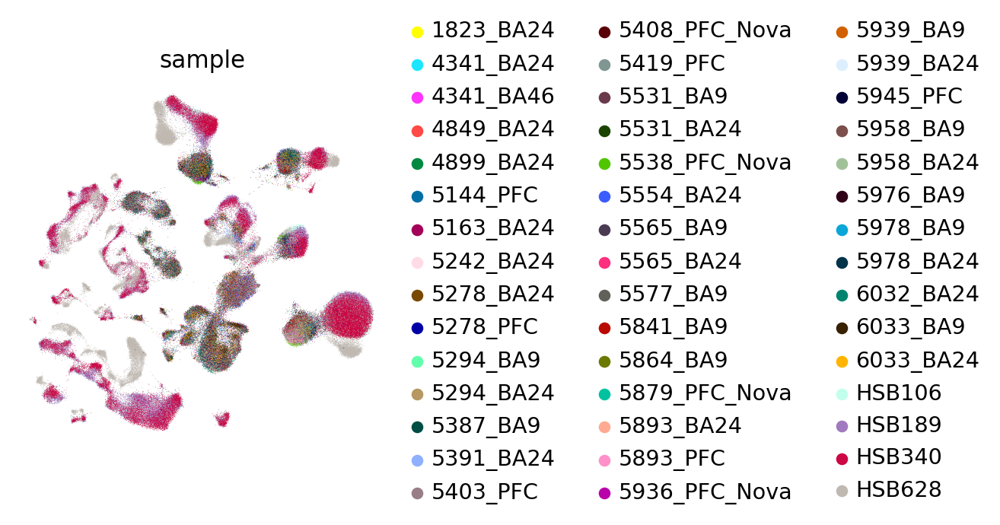

In [ ]:
sc.pl.umap(ad2, color=['sample'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


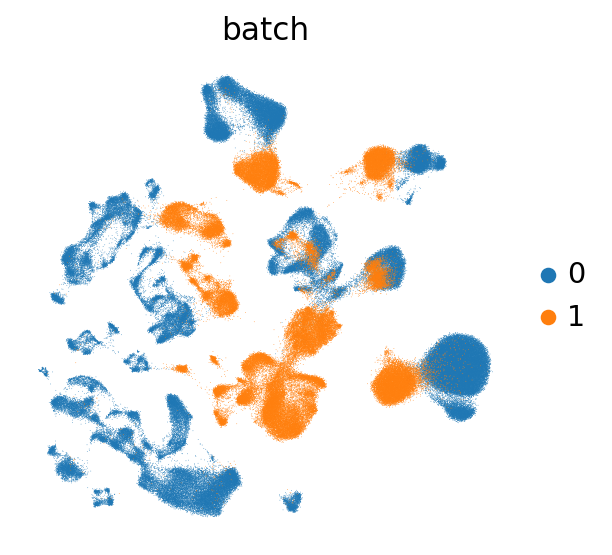

In [ ]:
sc.pl.umap(ad2, color=['batch'])

In [ ]:
sc.external.pp.harmony_integrate(ad2, key = ['sample','batch'])

2023-11-08 10:45:30,213 - harmonypy - INFO - Iteration 1 of 10
2023-11-08 10:50:56,413 - harmonypy - INFO - Iteration 2 of 10
2023-11-08 10:56:05,382 - harmonypy - INFO - Iteration 3 of 10
2023-11-08 10:59:20,684 - harmonypy - INFO - Iteration 4 of 10
2023-11-08 11:01:55,492 - harmonypy - INFO - Converged after 4 iterations


In [ ]:
ad2.obsm['X_umap_raw']=ad2.obsm['X_umap']

In [ ]:
sc.pp.neighbors(ad2, use_rep='X_pca_harmony')
sc.tl.umap(ad2)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


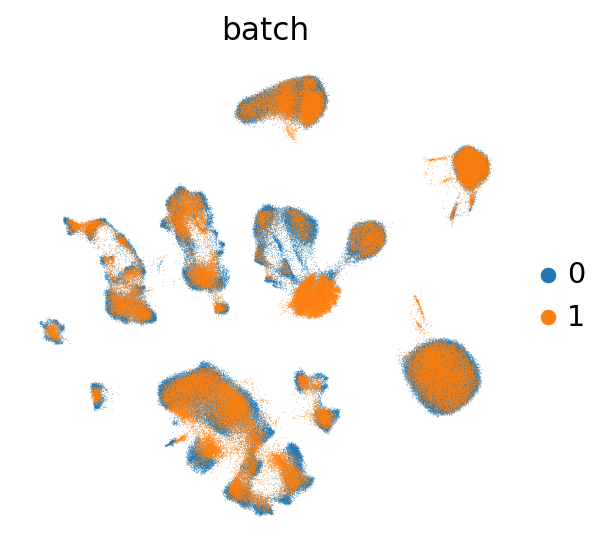

In [ ]:
sc.pl.umap(ad2, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


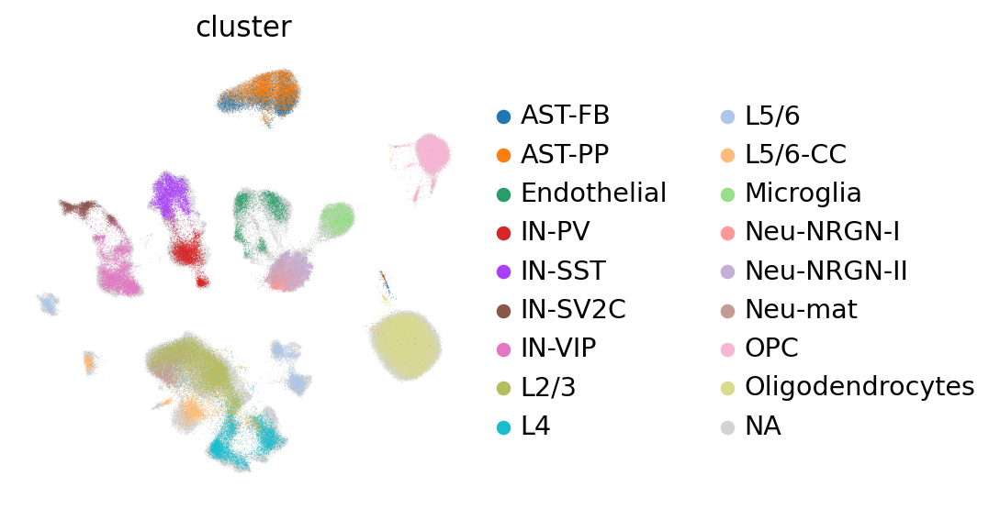

In [ ]:
sc.pl.umap(ad2, color=['cluster'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


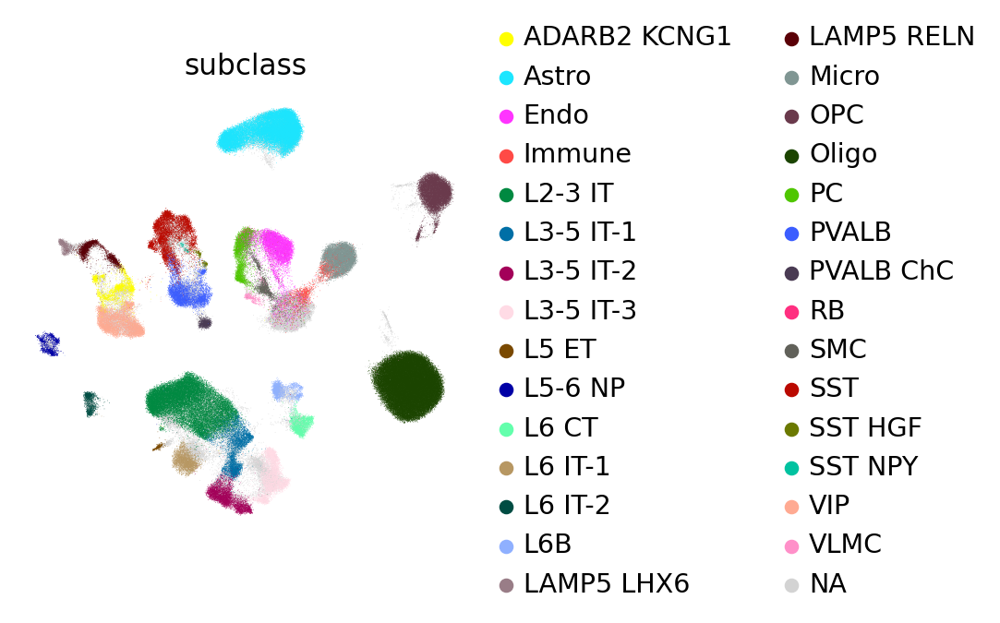

In [ ]:
sc.pl.umap(ad2, color=['subclass'])

In [ ]:
ad2.write_h5ad('data/integration/as_raw_count.h5ad')

In [ ]:
sc.external.pp.harmony_integrate(ad2, key = [aa'batch'])

2023-11-08 11:24:56,297 - harmonypy - INFO - Iteration 1 of 10
2023-11-08 11:28:40,645 - harmonypy - INFO - Iteration 2 of 10
2023-11-08 11:32:39,009 - harmonypy - INFO - Iteration 3 of 10
2023-11-08 11:34:28,902 - harmonypy - INFO - Iteration 4 of 10
2023-11-08 11:35:59,107 - harmonypy - INFO - Converged after 4 iterations


In [ ]:
ad2.obsm['X_umap_1']=ad2.obsm['X_umap']

In [ ]:
sc.pp.neighbors(ad2, use_rep='X_pca_harmony')
sc.tl.umap(ad2)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


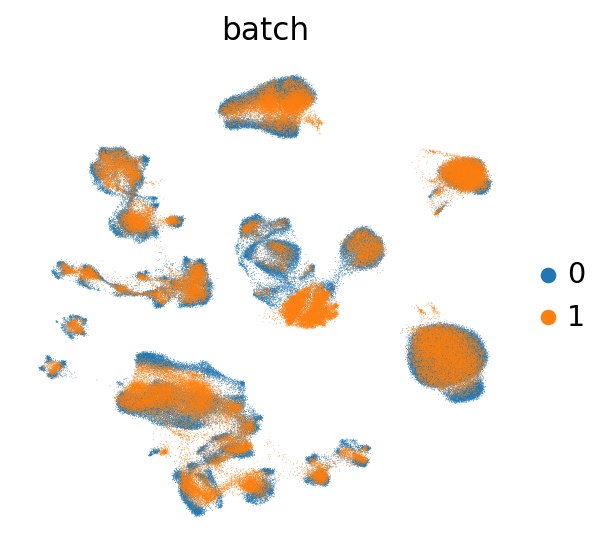

In [ ]:
sc.pl.umap(ad2, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


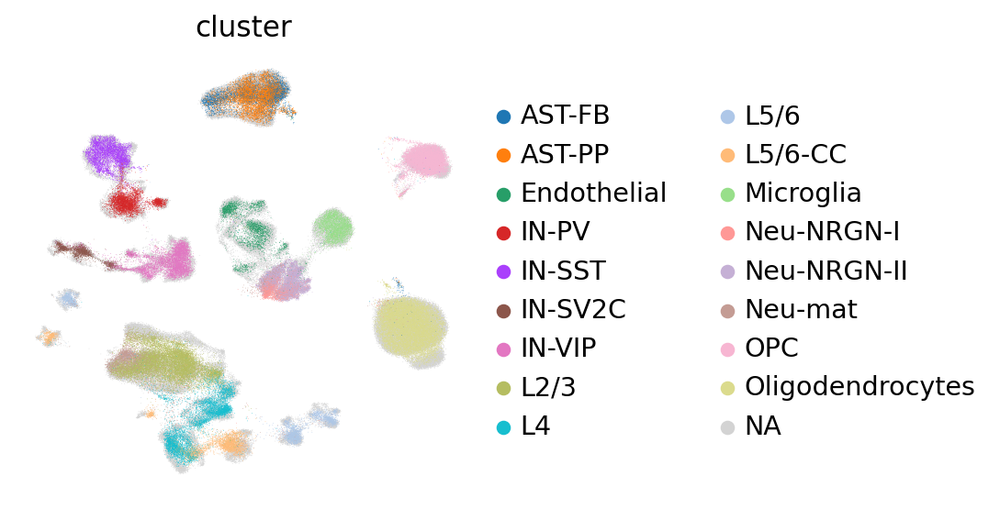

In [ ]:
sc.pl.umap(ad2, color=['cluster'])

In [ ]:
ad2.obs['class']

HSB106_1_AAACCCAAGAGGCGTT-0      Glia
HSB106_1_AAACCCAAGGTAGTCG-0      Glia
HSB106_1_AAACCCAAGGTTATAG-0      Glia
HSB106_1_AAACCCAAGTCGCCCA-0       ExN
HSB106_1_AAACCCACAAAGGAGA-0       ExN
                                 ... 
TTTGTCACAAAGTCAA-1_6033_BA9-1     NaN
TTTGTCACAAGGCTCC-1_6033_BA9-1     NaN
TTTGTCAGTCGATTGT-1_6033_BA9-1     NaN
TTTGTCATCCCAAGTA-1_6033_BA9-1     NaN
TTTGTCATCGTTACGA-1_6033_BA9-1     NaN
Name: class, Length: 276679, dtype: category
Categories (4, object): ['ExN', 'Glia', 'InN', 'NNC']

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


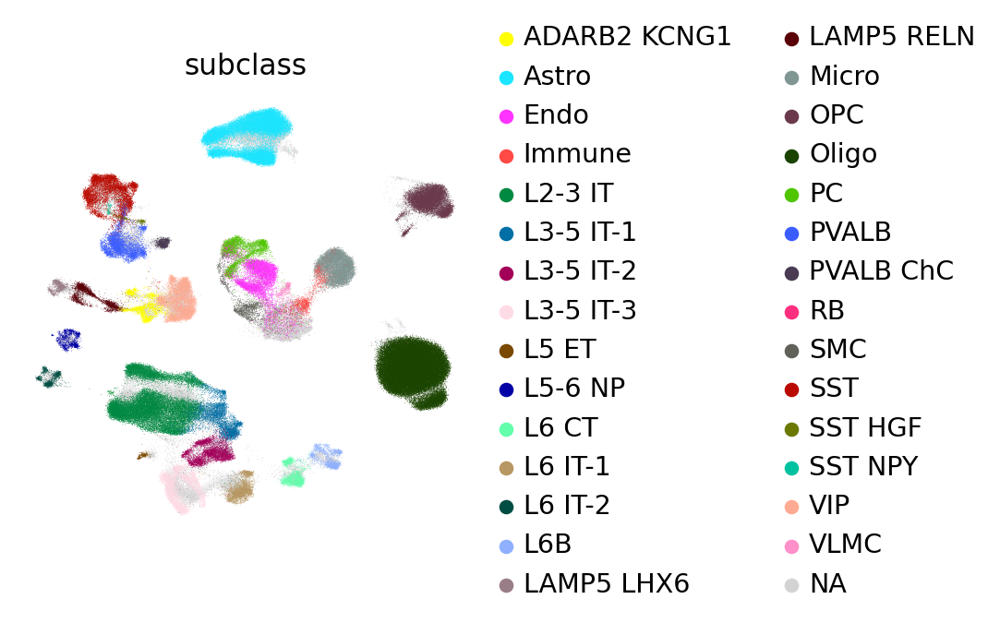

In [ ]:
sc.pl.umap(ad2, color=['subclass'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

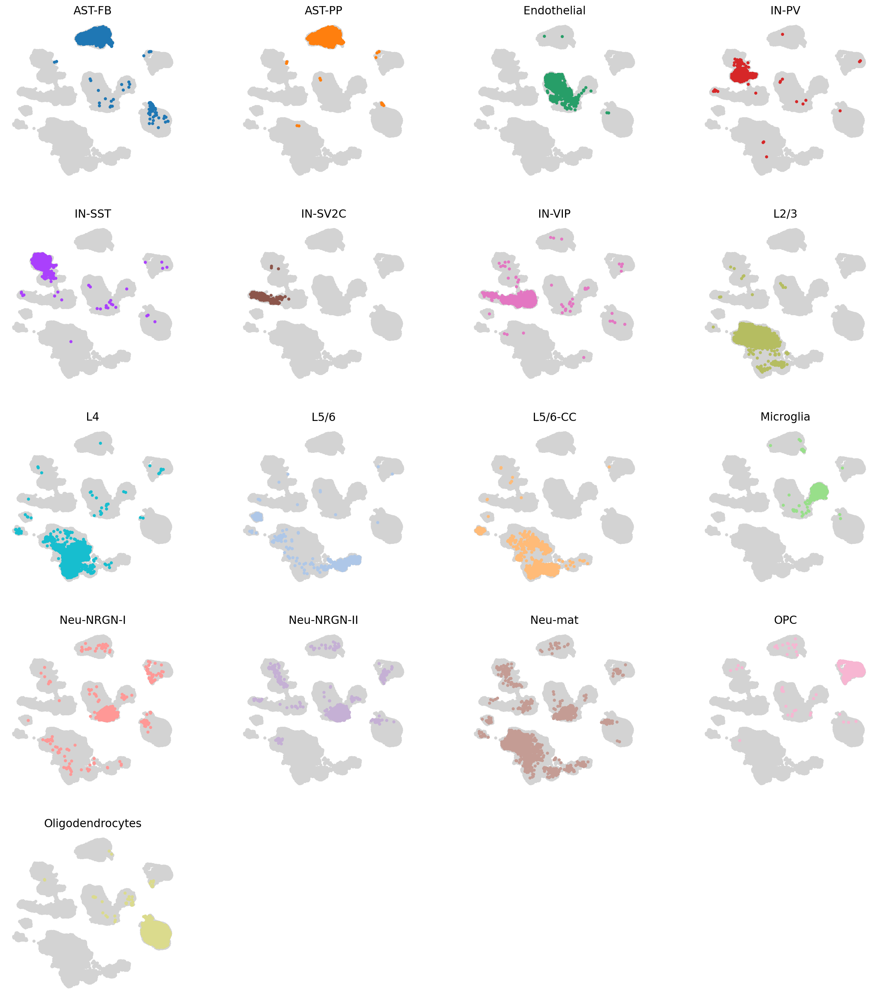

In [ ]:
cluster_small_multiples(ad2,'cluster')

In [ ]:
ad2=ad2[:,~ad2.var_names.isin(['PC','PVALB','SST','VIP'])]

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

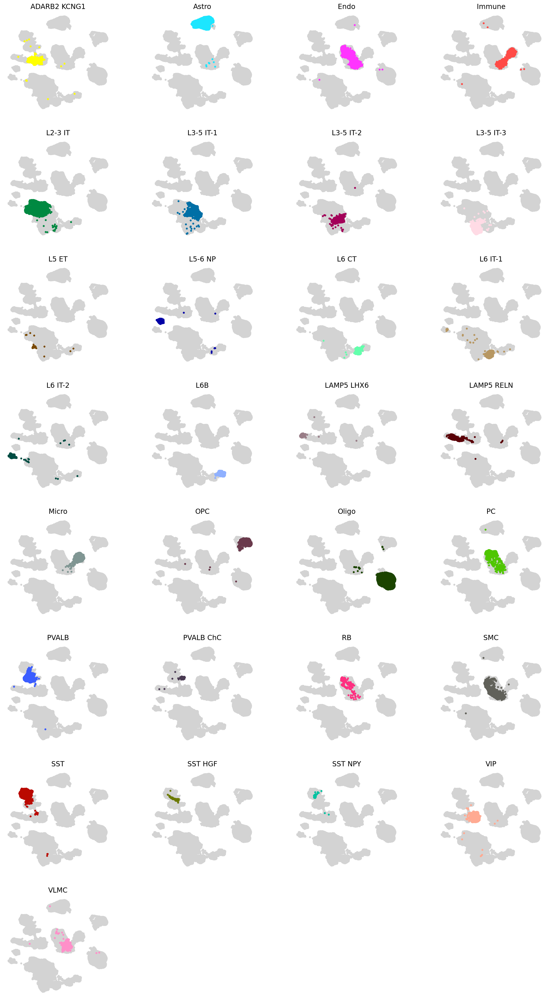

In [ ]:
cluster_small_multiples(ad2,'subclass')

In [ ]:
ad2.write_h5ad('data/integration/as_raw_count.h5ad')

# As normlized data

In [ ]:
sc.pp.normalize_total(ad, target_sum=1e4)
sc.pp.log1p(ad)

In [ ]:
ad.X.data

array([2.1901448, 2.1901448, 3.4887817, ..., 2.6776004, 2.6776004,
       2.6776004], dtype=float32)

In [ ]:
ad3=ad.concatenate(autism)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [ ]:
ad3

AnnData object with n_obs × n_vars = 276679 × 23063
    obs: 'subtype', 'subclass', 'class', 'samplename', 'tech_rep', 'species', 'sample', 'donor_gender', 'donor_age', 'cell_ID', 'organ', 'project_code', 'reference', 'seq_tech', 'sample_type', 'seq_method', 'treatment', 'region', 'subregion', 'donor_ID', 'original_name', 'original_name2', 'donor_status', 'sample_status', 'if_patient', 'ethnicity', 'sample_ID', 'Siletti_singleCellNet', 'Siletti_SingleR', 'Siletti_scPred', 'Siletti_scMap', 'Siletti_CHETAH', 'Siletti_scArches', 'Siletti_ACTINN', 'Siletti_modf_SCANVI_L1', 'Siletti_modf_SCANVI_L2', 'cell_type', 'cluster', 'individual', 'age', 'sex', 'diagnosis', 'Capbatch', 'Seqbatch', 'post-mortem interval (hours)', 'RNA Integrity Number', 'genes', 'UMIs', 'RNA mitochondr. percent', 'RNA ribosomal percent', 'batch'
    var: 'gene_ids-1', 'gene_names-1'

In [ ]:
ad3.obs

,subtype,subclass,class,samplename,tech_rep,species,sample,donor_gender,donor_age,cell_ID,...,diagnosis,Capbatch,Seqbatch,post-mortem interval (hours),RNA Integrity Number,genes,UMIs,RNA mitochondr. percent,RNA ribosomal percent,batch
HSB106_1_AAACCCAAGAGGCGTT-0,Oligo MOG OPALIN,Oligo,Glia,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGAGGCGTT,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCAAGGTAGTCG-0,Oligo MOG OPALIN,Oligo,Glia,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGGTAGTCG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCAAGGTTATAG-0,Oligo MOG OPALIN,Oligo,Glia,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGGTTATAG,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCAAGTCGCCCA-0,L3-5 RORB PCBP3 IL1RAPL2,L3-5 IT-1,ExN,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCAAGTCGCCCA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
HSB106_1_AAACCCACAAAGGAGA-0,L2-3 CUX2 ACVR1C THSD7A,L2-3 IT,ExN,HSB106,HSB106_1,Homo sapiens,HSB106,M,64yr,HSB106_1_AAACCCACAAAGGAGA,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAAAGTCAA-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,4555.0,10514.0,2.805783,1.245958,1
TTTGTCACAAGGCTCC-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,913.0,1276.0,0.156740,0.548589,1
TTTGTCAGTCGATTGT-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,1807.0,2874.0,0.591510,0.765484,1
TTTGTCATCCCAAGTA-1_6033_BA9-1,NaN,NaN,NaN,NaN,NaN,NaN,6033_BA9,NaN,NaN,NaN,...,ASD,CB7,SB2,25.0,8.0,1451.0,2185.0,1.922197,0.320366,1


In [ ]:
sc.pp.highly_variable_genes(ad3, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'sample')

... storing 'cell_ID' as categorical


In [ ]:
ad3.var.highly_variable.sum()

4527

In [ ]:
sc.tl.pca(ad3, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(ad3)
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


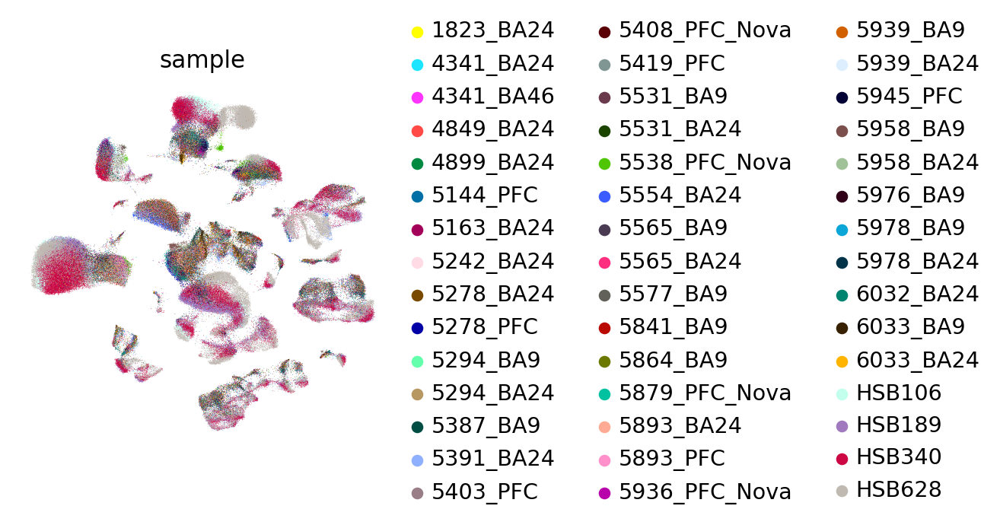

In [ ]:
sc.pl.umap(ad3, color=['sample'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


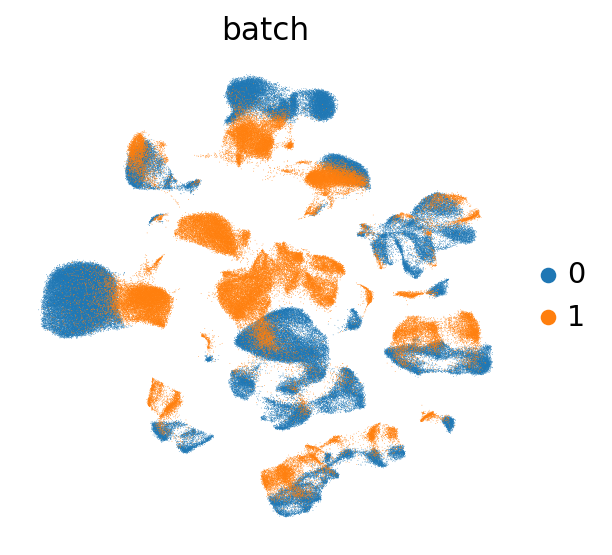

In [ ]:
sc.pl.umap(ad3, color=['batch'])

In [ ]:
sc.external.pp.harmony_integrate(ad3, key = ['sample','batch'])

2023-11-08 14:44:19,157 - harmonypy - INFO - Iteration 1 of 10
2023-11-08 14:48:33,784 - harmonypy - INFO - Iteration 2 of 10
2023-11-08 14:52:47,613 - harmonypy - INFO - Iteration 3 of 10
2023-11-08 14:57:00,174 - harmonypy - INFO - Iteration 4 of 10
2023-11-08 15:01:10,878 - harmonypy - INFO - Iteration 5 of 10
2023-11-08 15:03:04,050 - harmonypy - INFO - Iteration 6 of 10
2023-11-08 15:04:59,954 - harmonypy - INFO - Iteration 7 of 10
2023-11-08 15:06:44,565 - harmonypy - INFO - Iteration 8 of 10
2023-11-08 15:08:37,298 - harmonypy - INFO - Iteration 9 of 10
2023-11-08 15:10:35,389 - harmonypy - INFO - Iteration 10 of 10
2023-11-08 15:12:25,651 - harmonypy - INFO - Stopped before convergence


In [ ]:
ad3.obsm['X_umap_raw']=ad3.obsm['X_umap']

In [ ]:
sc.pp.neighbors(ad3, use_rep='X_pca_harmony')
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


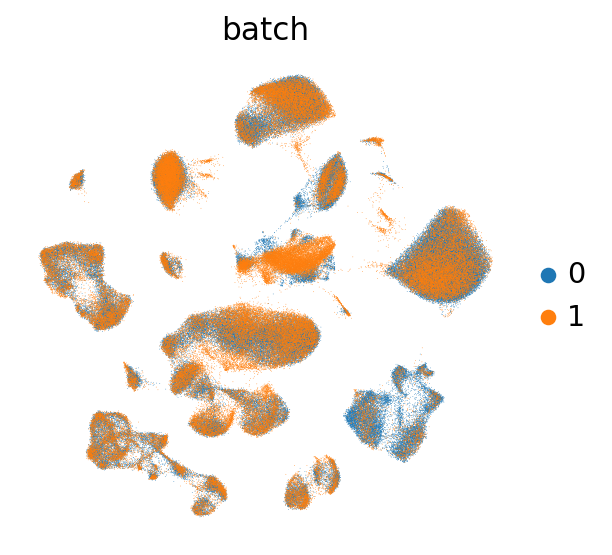

In [ ]:
sc.pl.umap(ad3, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


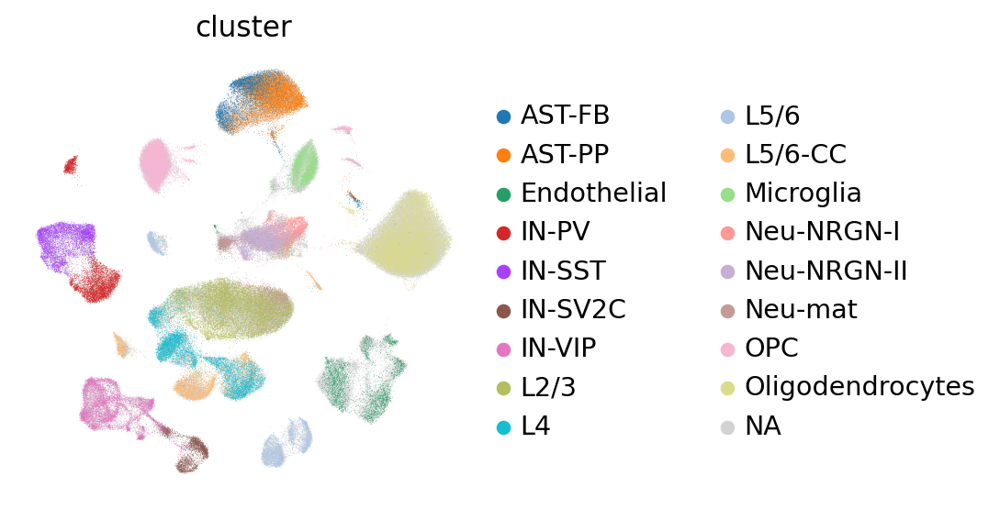

In [ ]:
sc.pl.umap(ad3, color=['cluster'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


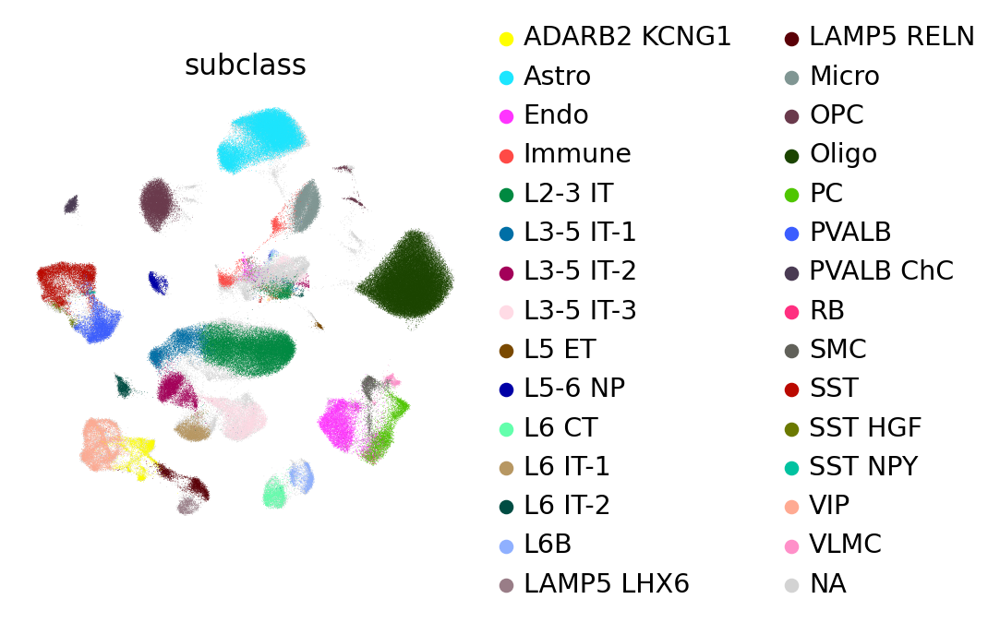

In [ ]:
sc.pl.umap(ad3, color=['subclass'])

In [ ]:
ad3.write_h5ad('data/integration/as_normlized_data.h5ad')

In [ ]:
sc.external.pp.harmony_integrate(ad3, key = ['batch'])

2023-11-08 15:38:19,525 - harmonypy - INFO - Iteration 1 of 10
2023-11-08 15:41:37,563 - harmonypy - INFO - Iteration 2 of 10
2023-11-08 15:44:53,763 - harmonypy - INFO - Iteration 3 of 10
2023-11-08 15:47:15,995 - harmonypy - INFO - Iteration 4 of 10
2023-11-08 15:48:34,496 - harmonypy - INFO - Iteration 5 of 10
2023-11-08 15:49:42,313 - harmonypy - INFO - Iteration 6 of 10
2023-11-08 15:50:50,912 - harmonypy - INFO - Iteration 7 of 10
2023-11-08 15:52:00,161 - harmonypy - INFO - Iteration 8 of 10
2023-11-08 15:53:09,867 - harmonypy - INFO - Iteration 9 of 10
2023-11-08 15:54:19,286 - harmonypy - INFO - Iteration 10 of 10
2023-11-08 15:55:17,533 - harmonypy - INFO - Stopped before convergence


In [ ]:
ad3.obsm['X_umap_1']=ad3.obsm['X_umap']

In [ ]:
sc.pp.neighbors(ad3, use_rep='X_pca_harmony')
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


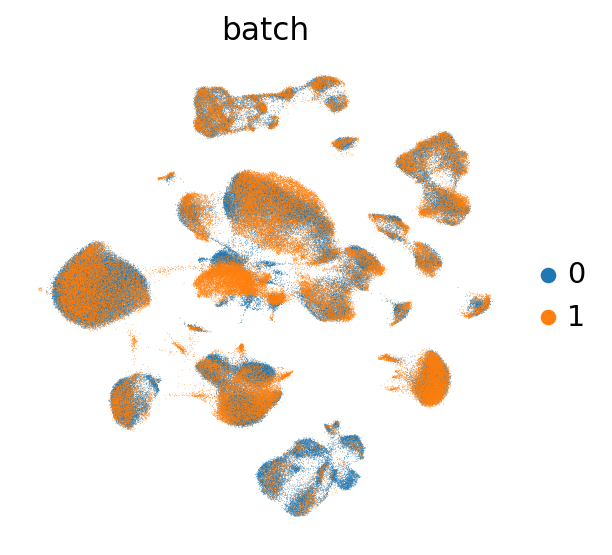

In [ ]:
sc.pl.umap(ad3, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


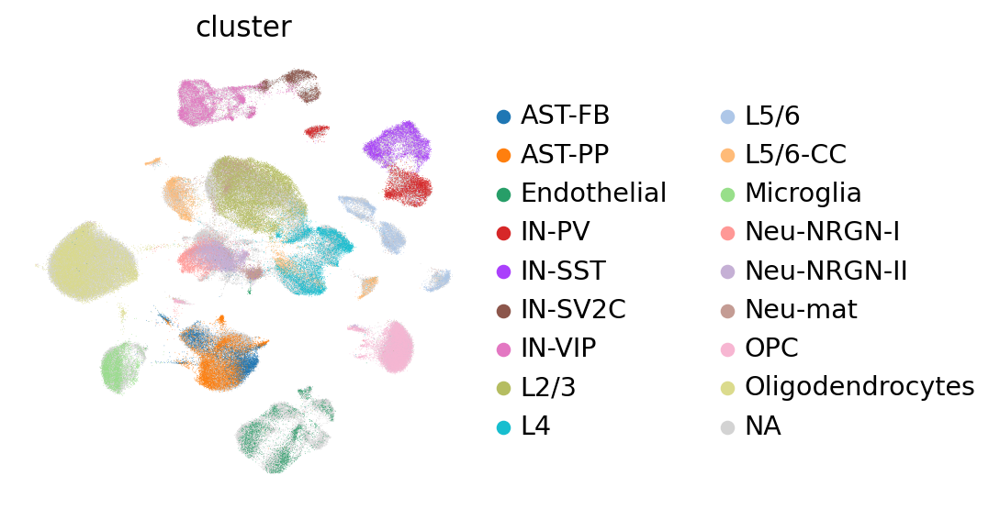

In [ ]:
sc.pl.umap(ad3, color=['cluster'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


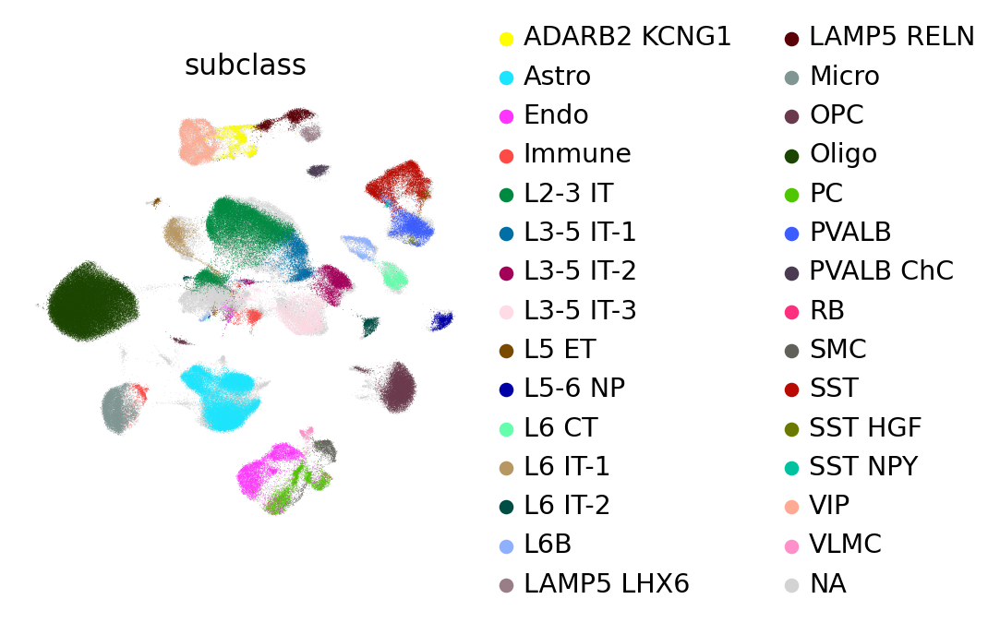

In [ ]:
sc.pl.umap(ad3, color=['subclass'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

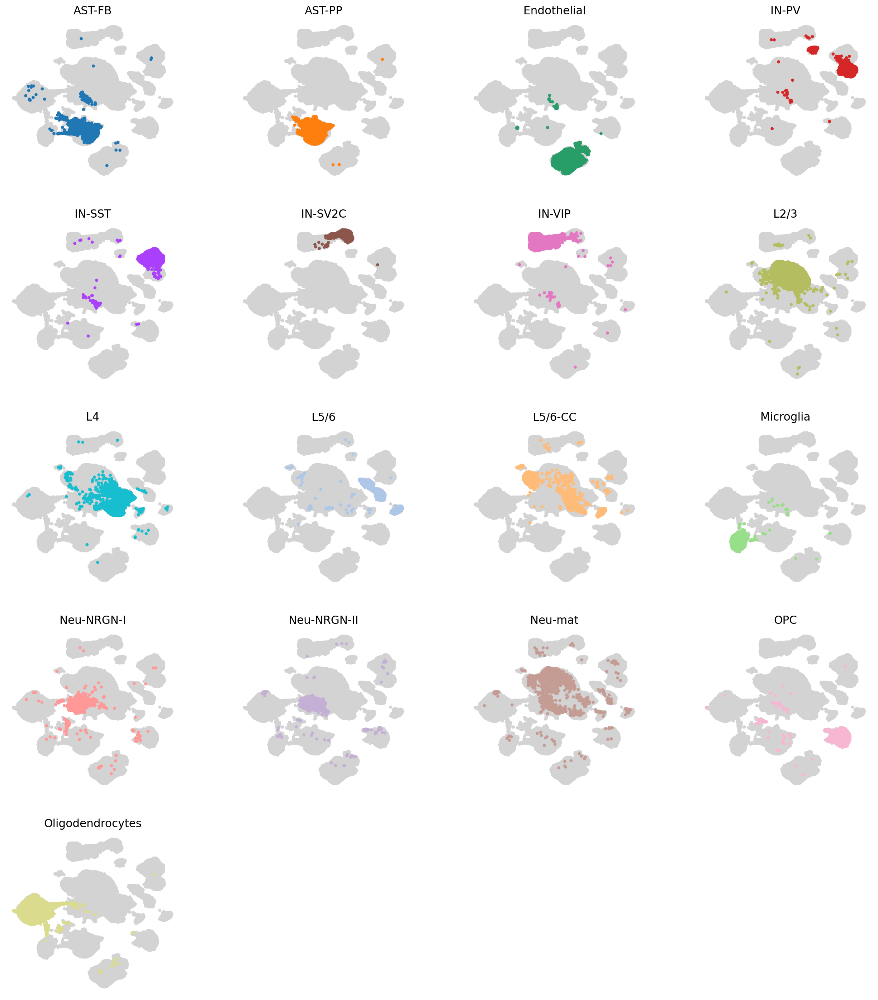

In [ ]:
cluster_small_multiples(ad3,'cluster')

In [ ]:
ad3=ad3[:,~ad3.var_names.isin(['PC','PVALB','SST','VIP'])]

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

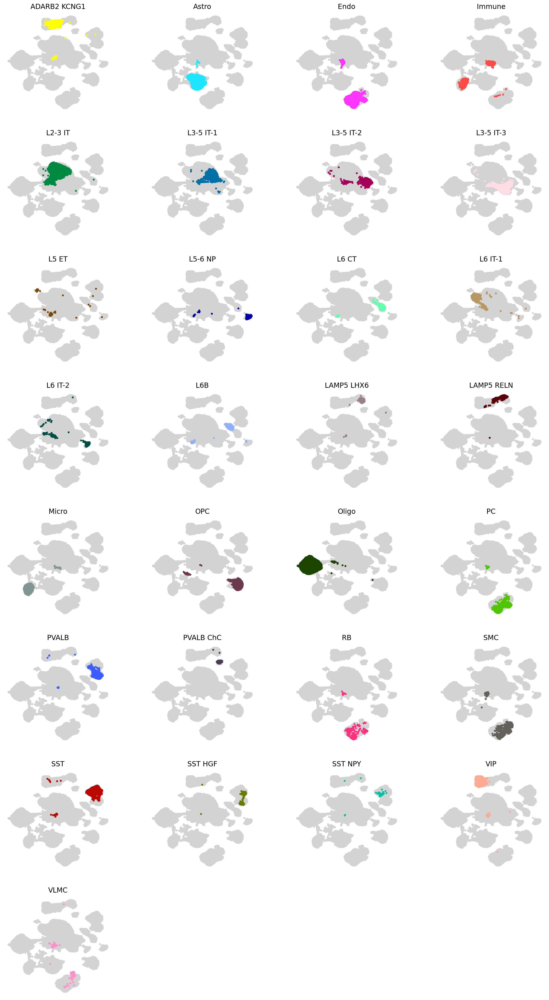

In [ ]:
cluster_small_multiples(ad3,'subclass')

In [ ]:
ad3.write_h5ad('data/integration/as_normlized_data.h5ad')

# As normlized data (1e6)

In [ ]:
ad=he1.copy()

In [ ]:
ad.X.data

array([1., 1., 3., ..., 1., 2., 1.], dtype=float32)

In [ ]:
sc.pp.normalize_total(ad, target_sum=1e6)
sc.pp.log1p(ad)

In [ ]:
ad.X.data

array([4.751842 , 4.751842 , 5.8446803, ..., 3.905236 , 4.588264 ,
       3.905236 ], dtype=float32)

In [ ]:
ad3=ad.concatenate(fetal)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [ ]:
ad3

AnnData object with n_obs × n_vars = 108559 × 17349
    obs: 'batch', 'stage', 'dissection', 'chemistry', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'leiden', 'phase', 'S_score', 'G2M_score', 'new_celltype', 'big_cluster', 'donor', 'gender', 'new_celltype-code', 'status_summary', 'productive_summary', 'isotype_summary', 'receptor_type', 'receptor_subtype', 'broad_celltype', 'cell_ID', 'seq_tech', 'seq_method', 'original_name', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'donor_ID', 'donor_gender', 'donor_age', 'ethnicity', 'treatment', 'if_patient', 'sample_ID', 'sample_status', 'sample_type', 'region', 'organ', 'study_new', 'AgeGroup', 'doublet_score', 'predicted_doublet', 'sample', 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'Sample', 'Age', 'Tissue', 'S.Score', 'G2M.Score', 'Phase', 'nCount_RNA', 'nFeature_RNA', 'Cell_group', 'Cell_type'
    var: 'gene_ids-0', 'n_cells-0', 'highly_variable5891STDY8062349-0', 'highly_variable

In [ ]:
sc.pp.highly_variable_genes(
    ad3,
    n_top_genes=2000,
    batch_key='sample',
    subset=False)

In [ ]:
ad3.var.highly_variable.sum()

2000

In [ ]:
sc.tl.pca(ad3, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(ad3)
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


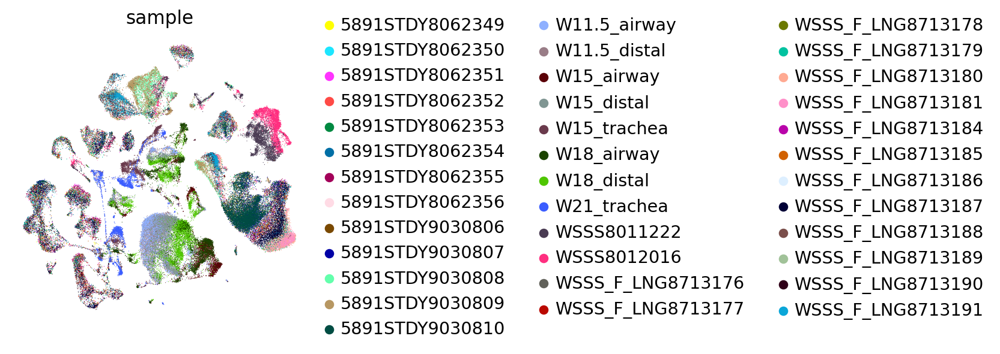

In [ ]:
sc.pl.umap(ad3, color=['sample'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


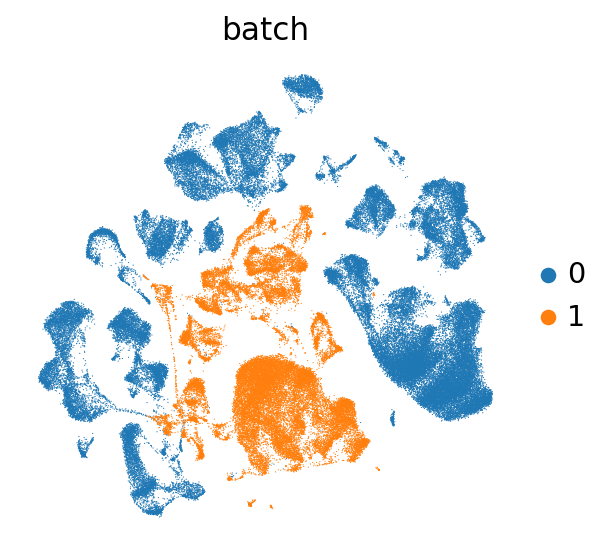

In [ ]:
sc.pl.umap(ad3, color=['batch'])

In [ ]:
ad3.obsm['X_umap_raw']=ad3.obsm['X_umap']

In [ ]:
sc.external.pp.harmony_integrate(ad3, key = ['batch'])

2023-11-10 16:29:37,388 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2023-11-10 16:30:40,698 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2023-11-10 16:31:43,869 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


In [ ]:
ad3.obsm['X_umap_1']=ad3.obsm['X_umap']

In [ ]:
sc.pp.neighbors(ad3, use_rep='X_pca_harmony')
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


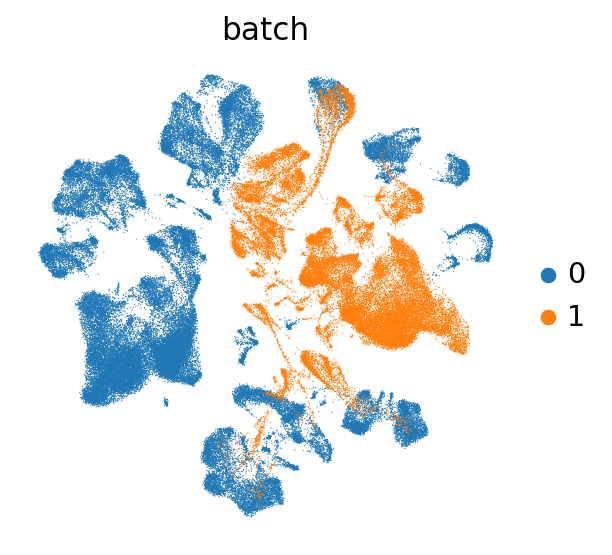

In [ ]:
sc.pl.umap(ad3, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


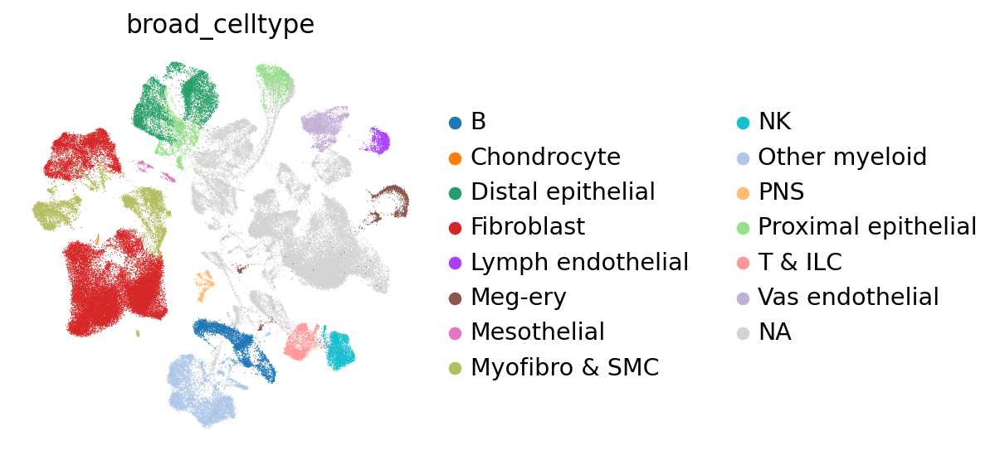

In [ ]:
sc.pl.umap(ad3, color=['broad_celltype'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


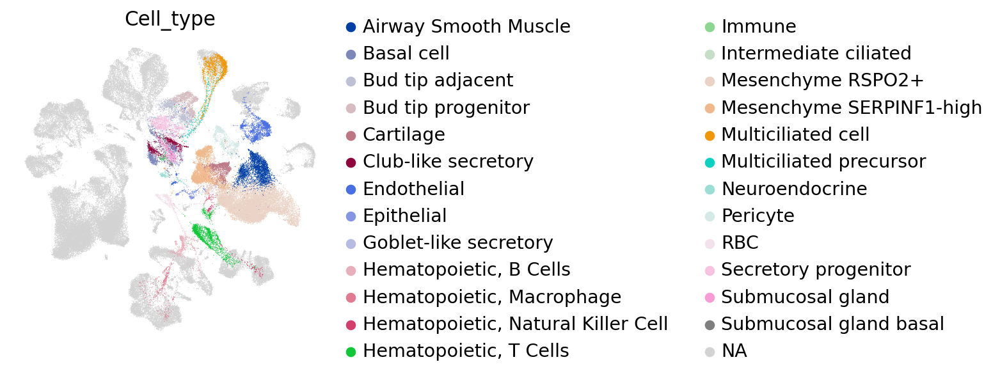

In [ ]:
sc.pl.umap(ad3, color=['Cell_type'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


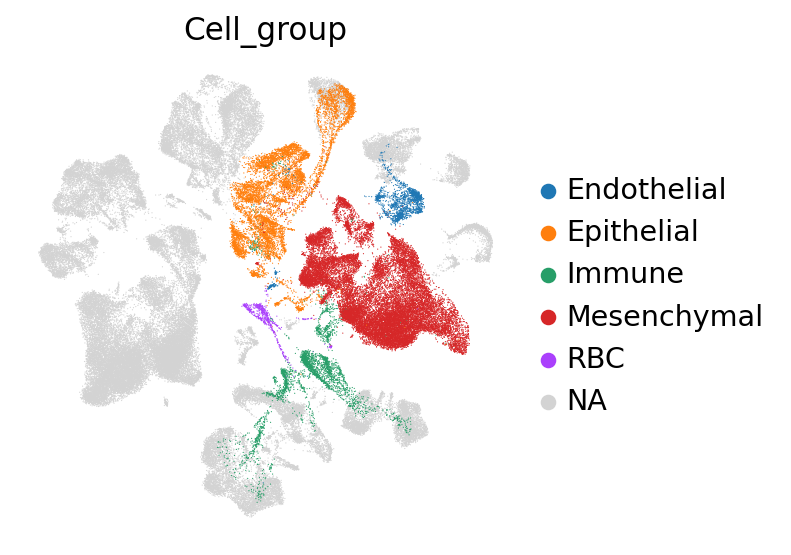

In [ ]:
sc.pl.umap(ad3, color=['Cell_group'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

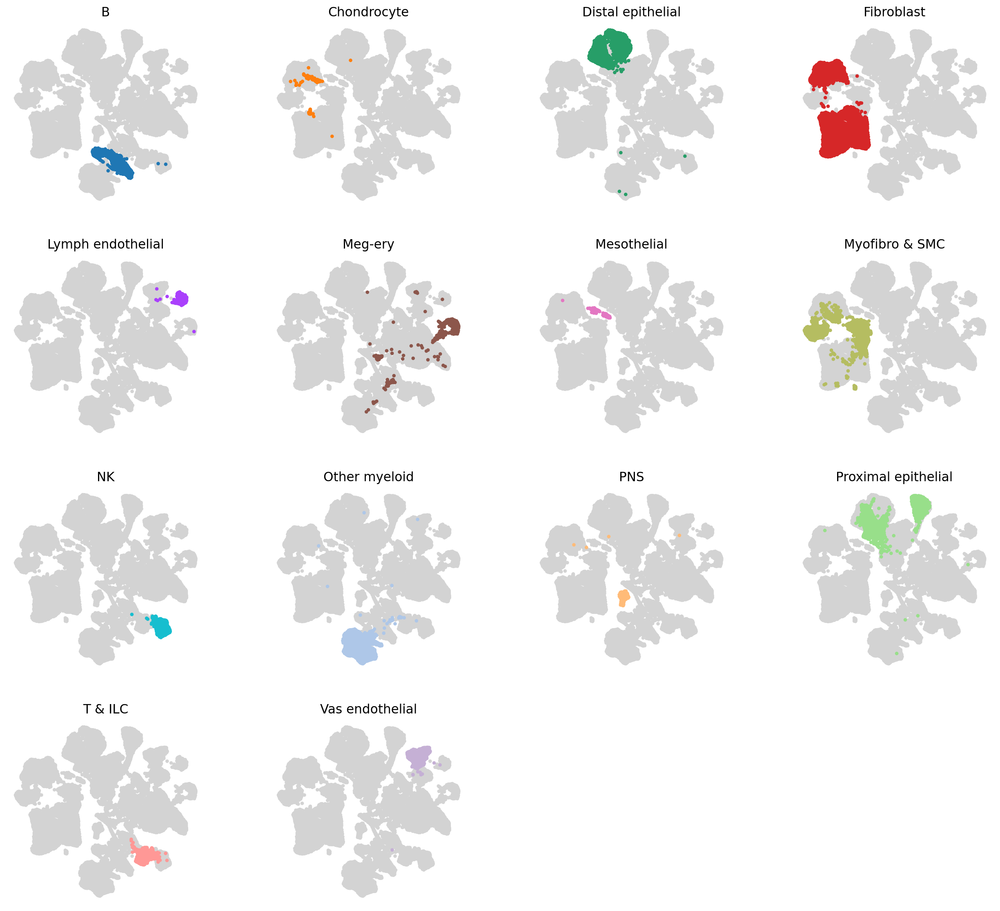

In [ ]:
cluster_small_multiples(ad3,'broad_celltype')

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

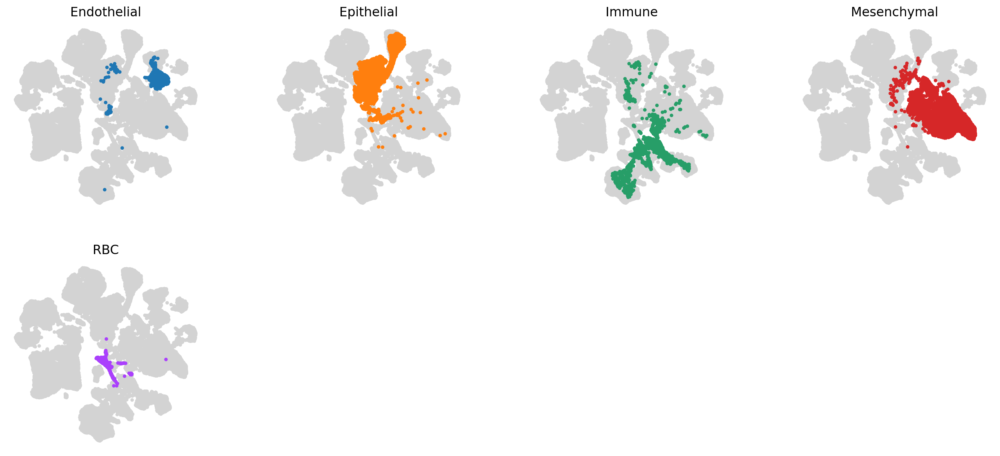

In [ ]:
cluster_small_multiples(ad3,'Cell_group')

In [ ]:
ad3.write_h5ad('data/integration/fetal_lung_as_normlized_data_1e6.h5ad')

# As normlized data (1e3)

In [ ]:
ad=he1.copy()

In [ ]:
ad.X.data

array([1., 1., 3., ..., 1., 2., 1.], dtype=float32)

In [ ]:
sc.pp.normalize_total(ad, target_sum=1e3)
sc.pp.log1p(ad)

In [ ]:
ad.X.data

array([0.10867266, 0.10867266, 0.29594195, ..., 0.04751488, 0.09287412,
       0.04751488], dtype=float32)

In [ ]:
ad3=ad.concatenate(fetal)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [ ]:
ad3

AnnData object with n_obs × n_vars = 108559 × 17349
    obs: 'batch', 'stage', 'dissection', 'chemistry', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'leiden', 'phase', 'S_score', 'G2M_score', 'new_celltype', 'big_cluster', 'donor', 'gender', 'new_celltype-code', 'status_summary', 'productive_summary', 'isotype_summary', 'receptor_type', 'receptor_subtype', 'broad_celltype', 'cell_ID', 'seq_tech', 'seq_method', 'original_name', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'donor_ID', 'donor_gender', 'donor_age', 'ethnicity', 'treatment', 'if_patient', 'sample_ID', 'sample_status', 'sample_type', 'region', 'organ', 'study_new', 'AgeGroup', 'doublet_score', 'predicted_doublet', 'sample', 'nGene', 'nUMI', 'orig.ident', 'percent.mito', 'Sample', 'Age', 'Tissue', 'S.Score', 'G2M.Score', 'Phase', 'nCount_RNA', 'nFeature_RNA', 'Cell_group', 'Cell_type'
    var: 'gene_ids-0', 'n_cells-0', 'highly_variable5891STDY8062349-0', 'highly_variable

In [ ]:
sc.pp.highly_variable_genes(
    ad3,
    n_top_genes=2000,
    batch_key='sample',
    subset=False)

In [ ]:
ad3.var.highly_variable.sum()

2000

In [ ]:
sc.tl.pca(ad3, svd_solver='arpack', use_highly_variable=True)
sc.pp.neighbors(ad3)
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


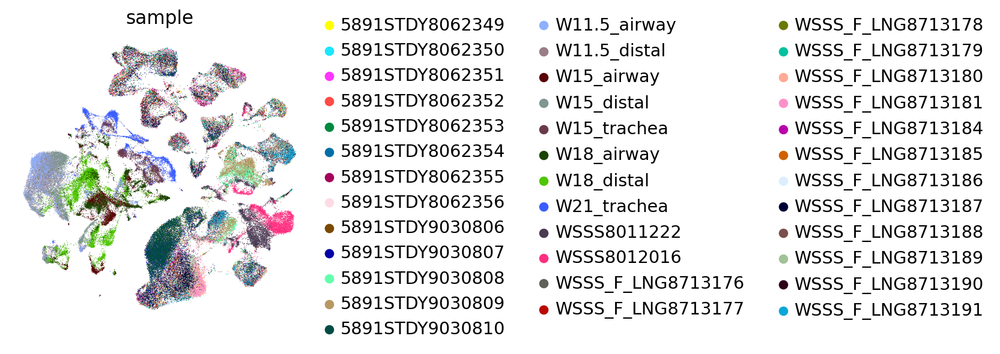

In [ ]:
sc.pl.umap(ad3, color=['sample'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


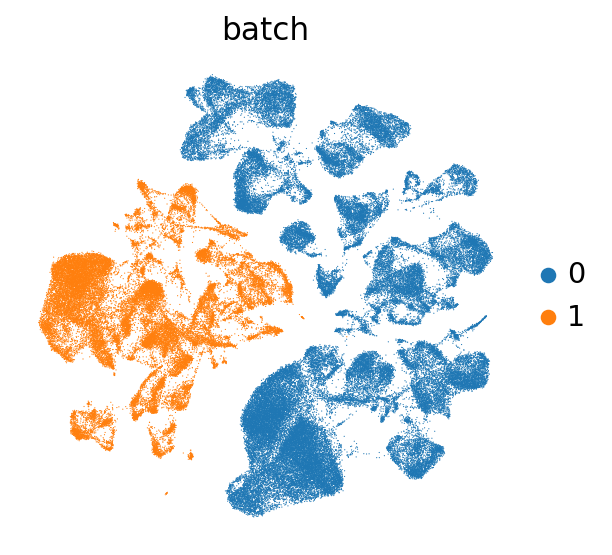

In [ ]:
sc.pl.umap(ad3, color=['batch'])

In [ ]:
ad3.obsm['X_umap_raw']=ad3.obsm['X_umap']

In [ ]:
sc.external.pp.harmony_integrate(ad3, key = ['batch'])

2023-11-10 17:35:54,705 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2023-11-10 17:36:57,481 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2023-11-10 17:38:02,081 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2023-11-10 17:39:02,117 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations


In [ ]:
sc.pp.neighbors(ad3, use_rep='X_pca_harmony')
sc.tl.umap(ad3)

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


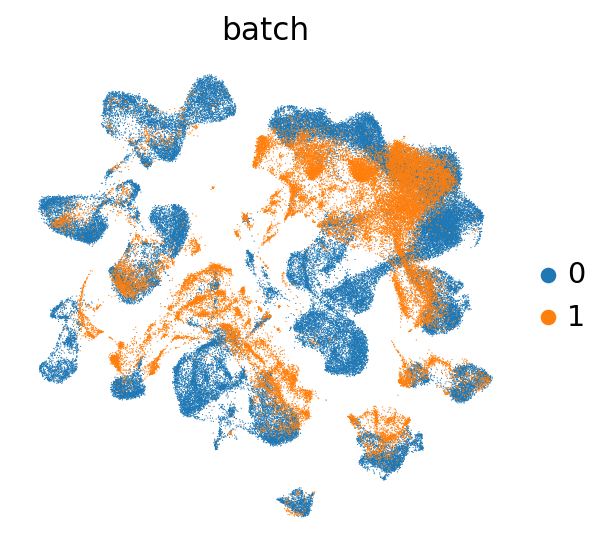

In [ ]:
sc.pl.umap(ad3, color=['batch'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


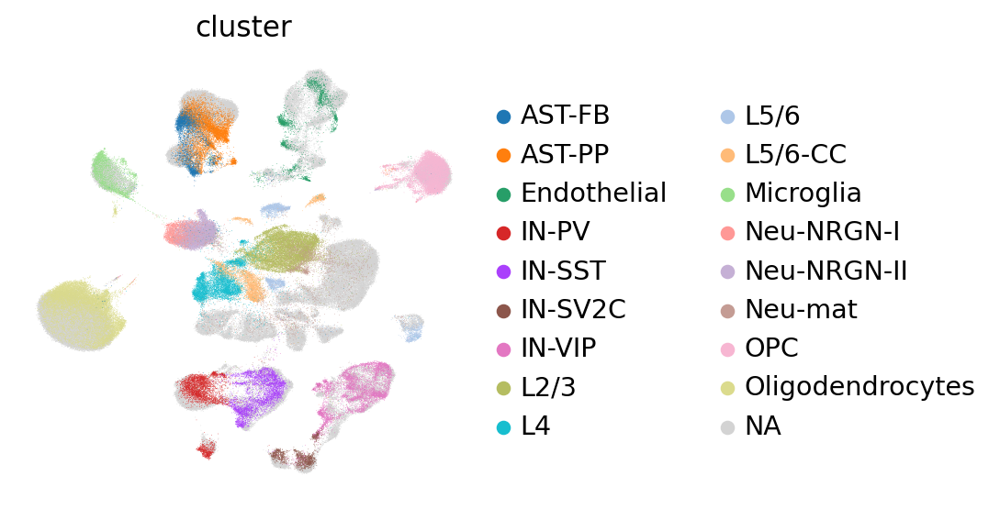

In [ ]:
sc.pl.umap(ad3, color=['cluster'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


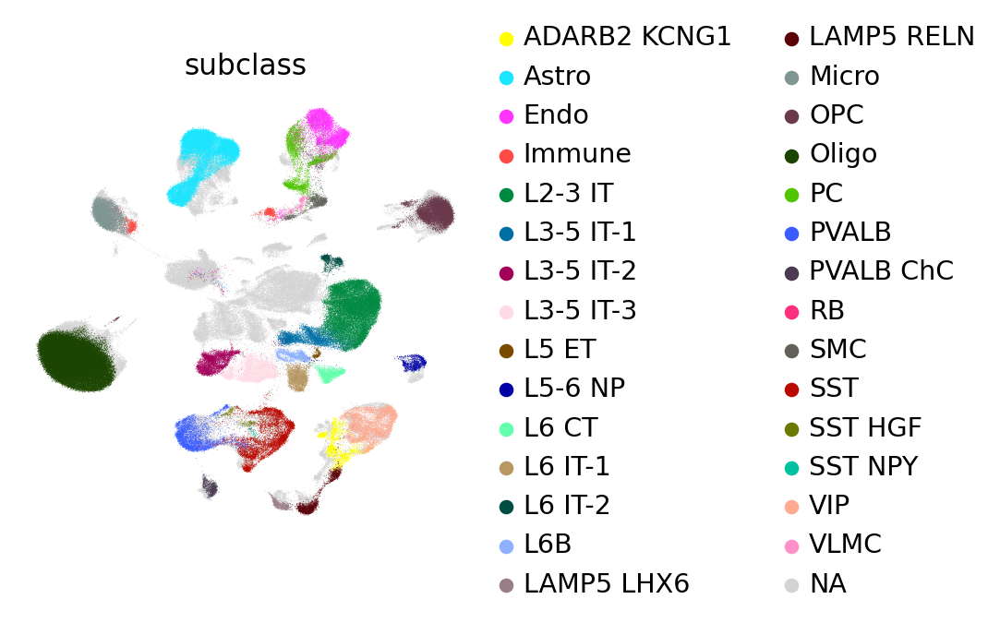

In [ ]:
sc.pl.umap(ad3, color=['subclass'])

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

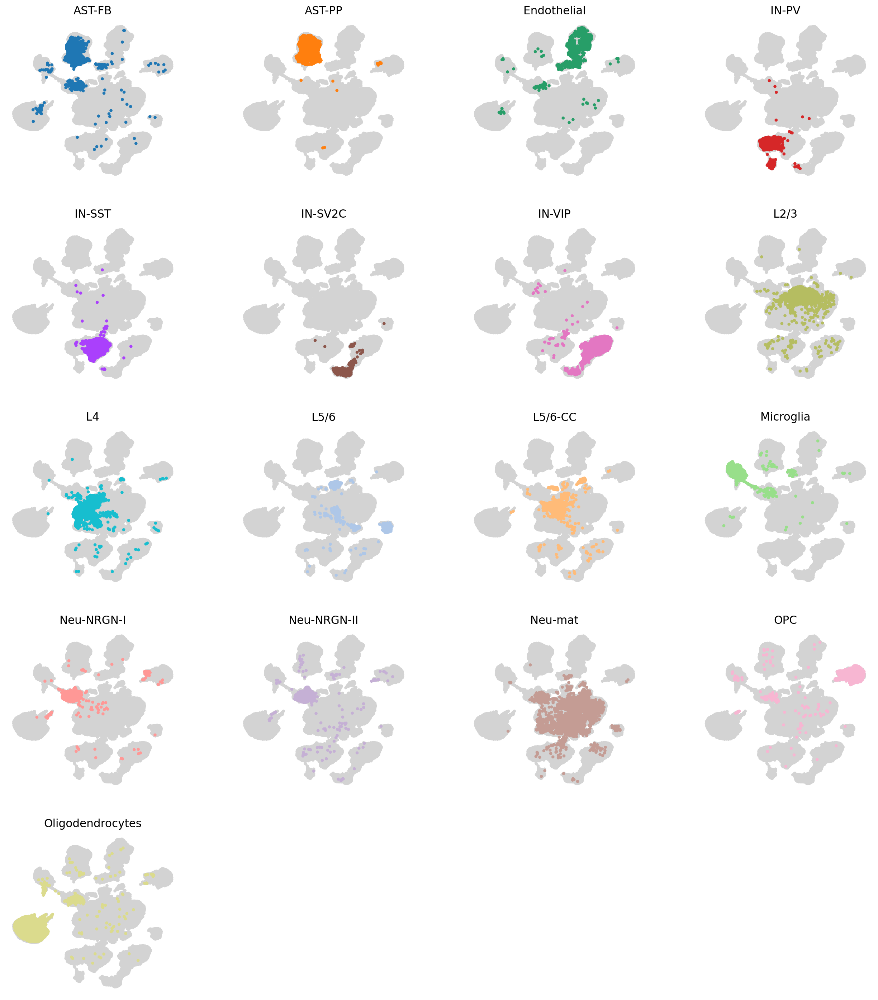

In [ ]:
cluster_small_multiples(ad3,'cluster')

In [ ]:
ad3=ad3[:,~ad3.var_names.isin(['PC','PVALB','SST','VIP'])]

/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/huang_yin/anaconda3/envs/sc/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping prov

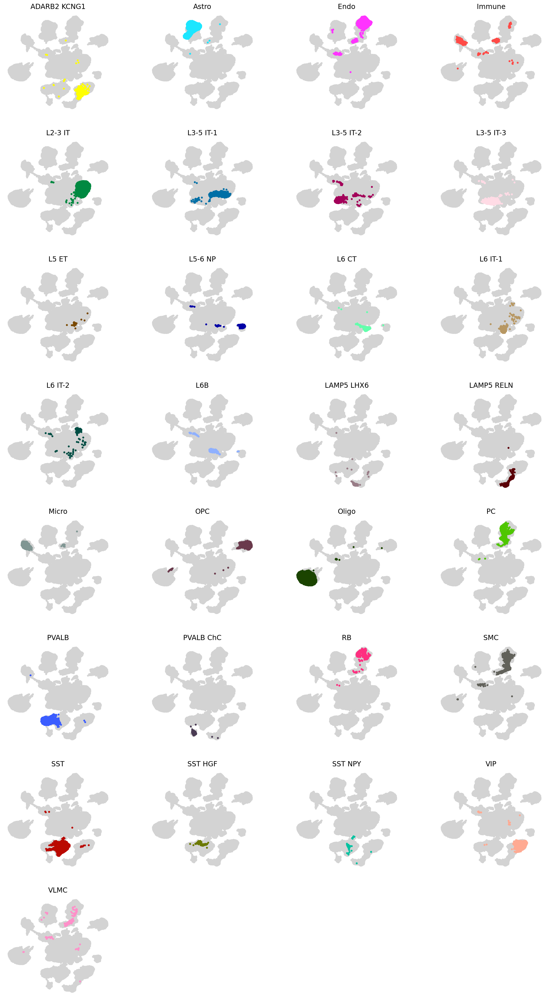

In [ ]:
cluster_small_multiples(ad3,'subclass')

In [ ]:
ad3.write_h5ad('data/integration/as_normlized_data_1e3.h5ad')

In [ ]:
sc.__version__

'1.9.5'

In [ ]:
human_brain_Lau_2020_10x 154846 33538
human_brain_Sadick_2022_10x 125653 36601
human_mouse_brain_source_Gaublomme_2019 39086 29110
human_brain_source_Fatma_2020 122032 17180

human_brain_source_Velmeshev_2019 104559 65217

human_brain_Otero-Garcia_2022_10x 124619 33694


human_brain_PFC_Kihara_2022_10x 33197 33538
human_brain_frontoparietal_Li_2018 17093 23476
human_brain_Microglia_Schirmer_2019_10x 48919 65217
human_brain_source_Tran_2021 72887 33538
human_brain_CV_SunN_2022_10x 22514 15055
mouse_brain_source_Habib_2017 13924 32111



In [ ]:
ms=read_cellbrowser('data/cellbrowserdatasets/ms/')

data/cellbrowserdatasets/ms/ [1.05065 1.05065 1.05065 ... 2.31274 2.31274 2.31274]


In [ ]:
ms

AnnData object with n_obs × n_vars = 48919 × 33741
    obs: 'cell_type', 'sample', 'diagnosis', 'stage', 'age', 'sex', 'region', 'Capbatch', 'Seqbatch', 'RIN', 'PMI', 'genes', 'UMIs', 'mito_perc', 'ribo_perc', 'DMGM_UL', 'DMGM_DL', 'DMWM', 'pseudotime'

In [ ]:
ms.obs

,cell_type,sample,diagnosis,stage,age,sex,region,Capbatch,Seqbatch,RIN,PMI,genes,UMIs,mito_perc,ribo_perc,DMGM_UL,DMGM_DL,DMWM,pseudotime
cell,,,,,,,,,,,,,,,,,,,
AAACCTGGTCCATGAT-1_5981_BA9,EN-L5-6,C8,Control,Control,44,female,prefrontal,CAP7,SEQ5,7.8,19,3674,9333,0.005143,0.002357,NaN,NaN,NaN,NaN
AAACGGGAGTAGCCGA-1_5981_BA9,EN-L2-3-B,C8,Control,Control,44,female,prefrontal,CAP7,SEQ5,7.8,19,2407,4853,0.004945,0.003709,NaN,NaN,NaN,1.555339
AAACGGGCATCGGTTA-1_5981_BA9,IN-PVALB,C8,Control,Control,44,female,prefrontal,CAP7,SEQ5,7.8,19,3593,7668,0.018519,0.006129,NaN,NaN,NaN,NaN
AAACGGGTCCATGAAC-1_5981_BA9,EN-L4,C8,Control,Control,44,female,prefrontal,CAP7,SEQ5,7.8,19,3288,6940,0.016427,0.007061,NaN,NaN,NaN,NaN
AAAGATGCACGACTCG-1_5981_BA9,EN-L5-6,C8,Control,Control,44,female,prefrontal,CAP7,SEQ5,7.8,19,4161,10297,0.007672,0.003108,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGTTAAGA-1_MS200_A303,OL-B,MS12,MS,Chronic inactive,44,female,prefrontal,CAP6,SEQ4,9.0,20,857,1227,0.003260,0.011410,41.0,6.0,12.0,NaN
TTTGTCAGTTCGCGAC-1_MS200_A303,EN-L4,MS12,MS,Chronic inactive,44,female,prefrontal,CAP6,SEQ4,9.0,20,5463,14703,0.010610,0.018160,41.0,6.0,12.0,NaN
TTTGTCAGTTCTGGTA-1_MS200_A303,Astrocytes,MS12,MS,Chronic inactive,44,female,prefrontal,CAP6,SEQ4,9.0,20,1560,2548,0.018838,0.003925,41.0,6.0,12.0,NaN


In [ ]:
ms.obs.diagnosis.value_counts()

MS         31516
Control    17403
Name: diagnosis, dtype: int64

In [ ]:
ms.obs.region.value_counts()

prefrontal        20055
motor-premotor    11492
temporal           9244
parietal           8128
Name: region, dtype: int64

In [ ]:
ms.obs.cell_type.value_counts()

OL-A             9642
Astrocytes       5381
OPC              3844
EN-L2-3-B        3291
EN-L4            3125
EN-L5-6          3058
EN-L2-3-A        2829
IN-VIP           2755
EN-MIX           2403
EN-PYR           2082
IN-PVALB         1897
OL-C             1598
IN-SST           1486
Microglia        1425
Glia-MIX         1226
OL-B             1154
IN-SV2C           779
Endo cells        375
Phagocytes        258
Stromal cells     153
T cells           105
B cells            53
Name: cell_type, dtype: int64

In [ ]:
haging=read_cellbrowser('data/cellbrowserdatasets/aging-brain/')

data/cellbrowserdatasets/aging-brain/ [2.3710601 2.3710601 2.3710601 ... 2.1570113 2.1570113 2.1570113]


In [ ]:
haging

AnnData object with n_obs × n_vars = 72543 × 19746
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'Batch', 'Age', 'Celltype', 'Subtype', 'RNA_snn_res.1.6', 'seurat_clusters', 'Cluster'

In [ ]:
haging.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mito,percent.ribo,Batch,Age,Celltype,Subtype,RNA_snn_res.1.6,seurat_clusters,Cluster
Cell,,,,,,,,,,,,
B1_AAACGGGGTAGTGAAT,old1,1030,534,0.076699,0.263107,A,old,imNeur,NaN,24,24,1
B1_AAAGATGGTCCGAGTC,old1,2624,1185,0.027439,0.099466,A,old,MG,NaN,8,8,1
B1_AAAGCAAGTACCTACA,old1,2721,1378,0.087835,0.090408,A,old,EPC,NaN,25,25,1
B1_AAAGCAAGTAGGCATG,old1,3329,1413,0.030039,0.151096,A,old,MG,NaN,8,8,1
B1_AAAGCAAGTCCTCTTG,old1,2961,1318,0.039514,0.118541,A,old,MG,NaN,8,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...
B4_TTTGTCAGTTGCGCAC,young4,1058,587,0.144612,0.108696,C,young,MG,NaN,1,1,4
B4_TTTGTCAGTTTGACTG,young4,1300,719,0.069231,0.188462,C,young,MG,NaN,1,1,4
B4_TTTGTCATCAACGCTA,young4,988,547,0.126518,0.084008,C,young,MG,NaN,1,1,4


In [ ]:
mhip

AnnData object with n_obs × n_vars = 3005 × 19972
    obs: 'tissue', 'group', 'total mRNA mol', 'well', 'sex', 'age', 'diameter', 'level1class', 'level2class', 'Expressed Genes', 'UMI Count'

In [ ]:
mhip.obs

,tissue,group,total mRNA mol,well,sex,age,diameter,level1class,level2class,Expressed Genes,UMI Count
1772071015-C02,sscortex,1,21580,11,1,21,0.00,interneurons,Int10,4848,9268.8200
1772071017-G12,sscortex,1,21748,95,-1,20,9.56,interneurons,Int10,4685,9050.3040
1772071017-A05,sscortex,1,31642,33,-1,20,11.10,interneurons,Int6,6028,12301.0680
1772071014-B06,sscortex,1,32916,42,1,21,11.70,interneurons,Int10,5824,12027.4550
1772067065-H06,sscortex,1,21531,48,1,25,11.00,interneurons,Int9,4701,9335.1040
...,...,...,...,...,...,...,...,...,...,...,...
1772067059-B04,ca1hippocampus,9,4585,26,-1,23,9.85,endothelial-mural,Peric,2221,3087.5852
1772066097-D04,ca1hippocampus,9,2559,28,-1,26,11.00,endothelial-mural,Vsmc,1428,1870.4265
1772063068-D01,sscortex,9,4015,4,1,26,8.63,endothelial-mural,Vsmc,1977,2673.3535
1772066098-A12,ca1hippocampus,9,2896,89,-1,26,9.23,endothelial-mural,Vsmc,1493,1915.8025
